In [2]:
import numpy as np
import librosa
import os
import pyedflib
import json
import sklearn
import matplotlib.pyplot as plt
import mne
import pywt
from pathlib import Path
from scipy.integrate import simpson
from scipy.signal import welch
from mne.time_frequency import psd_array_multitaper

In [2]:
files = []
files.append("data/eeg-13-03-24_12-14.edf")
files.append("data/eeg-06-05-24_13-07.edf")
files.append("data/eeg-21-03-24_13-50.edf")

iir_params = {'order':4, 'ftype':"butter"}
data = []
marks = []
loaded_data = []
for n in range(3):
    event_names = []
    loaded_data.append(mne.io.read_raw_edf(files[n]))
    loaded_data[n].load_data()
    loaded_data[n].set_montage('standard_1020')

    loaded_data[n].filter(2.,60., method='iir', iir_params=iir_params)
    
    events = mne.events_from_annotations(loaded_data[n])
    arr_events = events[0]
    print(arr_events)
    dict = events[1]
    if "wrong answer" in dict:
        event_names.append(dict["wrong answer"])
    if "right answer" in dict:
        event_names.append(dict["right answer"])
    for i in range(8):
        if arr_events[i,2] in event_names:
            if (arr_events[i,0] == arr_events[i+1,0]):
                break
        if arr_events[i,2] == event_names[1]:
            marks.append(1)
        if arr_events[i,2] == event_names[0]:
            marks.append(0)
    for i in range(8):
        if arr_events[i,2] in event_names:
            data.append(loaded_data[n].copy().crop(arr_events[i,0]/125-3,arr_events[i,0]/125+5))

print(data)
print(marks)

Extracting EDF parameters from C:\Users\Ilya\Documents\GitHub\EEG_feedback\EEG_preprocessing\data\eeg-13-03-24_12-14.edf...
EDF file detected
Setting channel info structure...
Creating raw.info structure...
Reading 0 ... 292874  =      0.000 ...  2342.992 secs...
Filtering raw data in 1 contiguous segment
Setting up band-pass filter from 2 - 60 Hz

IIR filter parameters
---------------------
Butterworth bandpass zero-phase (two-pass forward and reverse) non-causal filter:
- Filter order 16 (effective, after forward-backward)
- Cutoffs at 2.00, 60.00 Hz: -6.02, -6.02 dB

Used Annotations descriptions: ['end task', 'right answer', 'start task', 'wrong answer']
[[     1      0      3]
 [ 77860      0      2]
 [ 78184      0      1]
 [ 78184      0      3]
 [114049      0      2]
 [114370      0      1]
 [114376      0      3]
 [159373      0      4]
 [161062      0      1]
 [161062      0      3]
 [208801      0      2]
 [209140      0      1]
 [209140      0      3]
 [253420      0      

Extracting EDF parameters from C:\Users\Ilya\Documents\GitHub\EEG_feedback\EEG_preprocessing\data\Folder\S001R01.edf...
EDF file detected
Setting channel info structure...
Creating raw.info structure...
Reading 0 ... 9759  =      0.000 ...    60.994 secs...
Filtering raw data in 1 contiguous segment
Setting up band-pass filter from 1 - 45 Hz

IIR filter parameters
---------------------
Butterworth bandpass zero-phase (two-pass forward and reverse) non-causal filter:
- Filter order 16 (effective, after forward-backward)
- Cutoffs at 1.00, 45.00 Hz: -6.02, -6.02 dB

Filtering raw data in 1 contiguous segment
Setting up band-stop filter from 49 - 51 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandstop filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 49.38
- Lower transition bandwidth: 0.50 Hz (-6 dB cutoff frequency: 49.12 Hz)
- Upper pas

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   4 out of   4 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done  64 out of  64 | elapsed:    0.0s finished


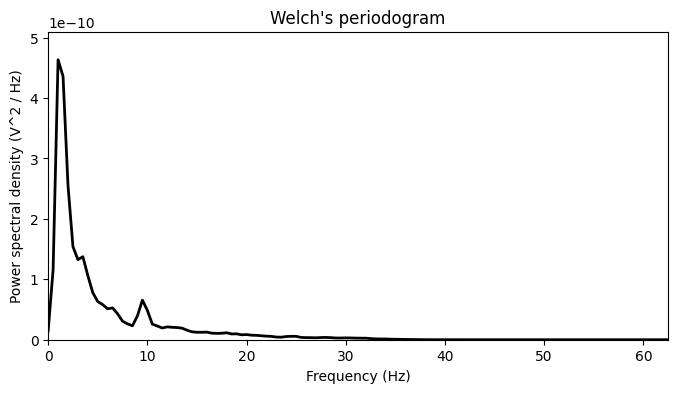

In [39]:
#file = "data/Folder/eeg-18-06-25_18-51.edf"
file = "data/Folder/S001R01.edf"

time = 30

iir_params = {'order':4, 'ftype':"butter"}
loaded_data = []
datanp = []
loaded_data = mne.io.read_raw_edf(file)
loaded_data.load_data()
#loaded_data.set_montage('standard_1020')

loaded_data.filter(1.,45., method='iir', iir_params=iir_params)
loaded_data.notch_filter(50, fir_design='firwin')

print(loaded_data.get_data())
window_length = 2 # seconds
sf = 125
win = window_length*sf
xX=loaded_data.get_data()
print(xX[0])
freqs, psds = welch(xX[0], sf, nperseg=win)

#sns.set(font_scale=1.2, style='white')
plt.figure(figsize=(8, 4))
plt.plot(freqs, psds, color='k', lw=2)
plt.xlabel('Frequency (Hz)')
plt.ylabel('Power spectral density (V^2 / Hz)')
plt.ylim([0, psds.max() * 1.1])
plt.title("Welch's periodogram")
plt.xlim([0, freqs.max()])
plt.show()

#events = mne.events_from_annotations(loaded_data)
#arr_events = events[0]
#print(arr_events)
#print(arr_events.shape[0])
#dict = events[1]

#for i in range(arr_events.shape[0]):
#    if arr_events[i,2] == dict["start task"]:    
#        data = []
#        mark1 = arr_events[i,0]/125
#        mark2 = arr_events[i+1,0]/125
#        ep = int((mark2-mark1)/time)
#        print(ep)
#        for x in range(ep-1):
#            print((x+1)*time)
#            print((x+2)*time)
#            data.append(loaded_data.copy().crop(mark1+(x+1)*time,mark1+(x+2)*time))
#        datanp.append(data)
                            
#print(datanp)

In [66]:
file = "data/Folder/eeg-25-06-25_18-18.edf"

time = 30

iir_params = {'order':4, 'ftype':"butter"}
loaded_data = []
datanp = []
loaded_data = mne.io.read_raw_edf(file)
loaded_data.load_data()
loaded_data.set_montage('standard_1020')

loaded_data.filter(1.,45., method='iir', iir_params=iir_params)
loaded_data.notch_filter(60, fir_design='firwin')
loaded_data.notch_filter(50, fir_design='firwin')
loaded_data.notch_filter(25, fir_design='firwin')

events = mne.events_from_annotations(loaded_data)
arr_events = events[0]
print(arr_events)
print(arr_events.shape[0])
dict = events[1]

for i in range(arr_events.shape[0]):
    if arr_events[i,2] == dict["start task"]:    
        data = []
        mark1 = arr_events[i,0]/125
        mark2 = arr_events[i+1,0]/125
        ep = int((mark2-mark1)/time)
        print(ep)
        for x in range(ep-1):
            print((x+1)*time)
            print((x+2)*time)
            data.append(loaded_data.copy().crop(mark1+(x+1)*time,mark1+(x+2)*time))
        datanp.append(data)
                            
print(datanp)

Extracting EDF parameters from C:\Users\Ilya\Documents\GitHub\EEG_feedback\EEG_preprocessing\data\Folder\eeg-25-06-25_18-18.edf...
EDF file detected
Setting channel info structure...
Creating raw.info structure...
Reading 0 ... 262249  =      0.000 ...  2097.992 secs...
Filtering raw data in 1 contiguous segment
Setting up band-pass filter from 1 - 45 Hz

IIR filter parameters
---------------------
Butterworth bandpass zero-phase (two-pass forward and reverse) non-causal filter:
- Filter order 16 (effective, after forward-backward)
- Cutoffs at 1.00, 45.00 Hz: -6.02, -6.02 dB

Filtering raw data in 1 contiguous segment
Setting up band-stop filter from 59 - 61 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandstop filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 59.35
- Lower transition bandwidth: 0.50 Hz (-6 dB cutoff frequency: 59.10 Hz

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   4 out of   4 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   8 out of   8 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   4 out of   4 | elapsed:    0.0s remaining:    0.0s


Filtering raw data in 1 contiguous segment
Setting up band-stop filter from 24 - 26 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandstop filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 24.44
- Lower transition bandwidth: 0.50 Hz (-6 dB cutoff frequency: 24.19 Hz)
- Upper passband edge: 25.56 Hz
- Upper transition bandwidth: 0.50 Hz (-6 dB cutoff frequency: 25.81 Hz)
- Filter length: 825 samples (6.600 s)

Used Annotations descriptions: ['end task', 'start task', 'wrong answer']


[Parallel(n_jobs=1)]: Done   8 out of   8 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   4 out of   4 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   8 out of   8 | elapsed:    0.0s finished


[[     1      0      2]
 [ 26323      0      3]
 [ 26806      0      1]
 [ 26806      0      2]
 [261391      0      3]
 [262168      0      1]]
6
7
30
60
60
90
90
120
120
150
150
180
180
210
62
30
60
60
90
90
120
120
150
150
180
180
210
210
240
240
270
270
300
300
330
330
360
360
390
390
420
420
450
450
480
480
510
510
540
540
570
570
600
600
630
630
660
660
690
690
720
720
750
750
780
780
810
810
840
840
870
870
900
900
930
930
960
960
990
990
1020
1020
1050
1050
1080
1080
1110
1110
1140
1140
1170
1170
1200
1200
1230
1230
1260
1260
1290
1290
1320
1320
1350
1350
1380
1380
1410
1410
1440
1440
1470
1470
1500
1500
1530
1530
1560
1560
1590
1590
1620
1620
1650
1650
1680
1680
1710
1710
1740
1740
1770
1770
1800
1800
1830
1830
1860
[[<RawEDF | eeg-25-06-25_18-18.edf, 8 x 3751 (30.0 s), ~253 kB, data loaded>, <RawEDF | eeg-25-06-25_18-18.edf, 8 x 3751 (30.0 s), ~253 kB, data loaded>, <RawEDF | eeg-25-06-25_18-18.edf, 8 x 3751 (30.0 s), ~253 kB, data loaded>, <RawEDF | eeg-25-06-25_18-18.edf, 8

In [46]:
files = []
files.append("data/Folder/eeg-30-06-25_20-41.edf") #игра
files.append("data/Folder/eeg-30-06-25_20-09.edf") #видео
files.append("data/Folder/eeg-25-06-25_18-18.edf") #сон
#files.append("data/Folder/eeg-18-06-25_18-51.edf") #видео
files.append("data/Folder/eeg-30-06-25_19-34.edf") #отдых
files.append("data/Folder/eeg-30-06-25_19-22.edf") #сон
#files.append("data/Folder/eeg-30-06-25_19-11.edf") #сон

files.append("data/Folder/eeg-07-07-25_12-58.edf") #отдых
#files.append("data/Folder/eeg-07-07-25_13-09.edf") #игра
#files.append("data/Folder/eeg-07-07-25_13-29.edf") #кроссворд

#files.append("data/Folder/eeg-10-07-25_13-53.edf") #игра
#files.append("data/Folder/eeg-10-07-25_13-44.edf") #игра
files.append("data/Folder/eeg-10-07-25_13-18.edf") #отдых
files.append("data/Folder/eeg-10-07-25_14-53.edf") #кроссворд
files.append("data/Folder/eeg-10-07-25_14-25.edf") #кроссворд

print(files)
datanp = []
for n in range(len(files)):

    time = 40
    
    iir_params = {'order':4, 'ftype':"butter"}
    loaded_data = []
    loaded_data = mne.io.read_raw_edf(files[n])
    loaded_data.load_data()
    loaded_data.set_montage('standard_1020')
    
    loaded_data.filter(4.,47., method='iir', iir_params=iir_params)
    loaded_data.notch_filter(60, fir_design='firwin')
    loaded_data.notch_filter(50, fir_design='firwin')
    
    events = mne.events_from_annotations(loaded_data)
    arr_events = events[0]
    print(arr_events)
    print(arr_events.shape[0])
    dict = events[1]
    
    for i in range(arr_events.shape[0]):
        if arr_events[i,2] == dict["start task"]:    
            data = []
            mark1 = arr_events[i,0]/125
            mark2 = arr_events[i+1,0]/125
            ep = int((mark2-mark1)/time)
            print(ep)
            for x in range(ep-1):
                print((x+1)*time)
                print((x+2)*time)
                data.append(loaded_data.copy().crop(mark1+(x+1)*time,mark1+(x+2)*time))
            print('---------')
            print(len(data))
            print('---------')
            datanp.append(data)
                                
print(datanp)

['data/Folder/eeg-30-06-25_20-41.edf', 'data/Folder/eeg-30-06-25_20-09.edf', 'data/Folder/eeg-25-06-25_18-18.edf', 'data/Folder/eeg-30-06-25_19-34.edf', 'data/Folder/eeg-30-06-25_19-22.edf', 'data/Folder/eeg-07-07-25_12-58.edf', 'data/Folder/eeg-10-07-25_13-18.edf', 'data/Folder/eeg-10-07-25_14-53.edf', 'data/Folder/eeg-10-07-25_14-25.edf']
Extracting EDF parameters from C:\Users\Ilya\Documents\GitHub\EEG_feedback\EEG_preprocessing\data\Folder\eeg-30-06-25_20-41.edf...
EDF file detected
Setting channel info structure...
Creating raw.info structure...
Reading 0 ... 119499  =      0.000 ...   955.992 secs...
Filtering raw data in 1 contiguous segment
Setting up band-pass filter from 4 - 47 Hz

IIR filter parameters
---------------------
Butterworth bandpass zero-phase (two-pass forward and reverse) non-causal filter:
- Filter order 16 (effective, after forward-backward)
- Cutoffs at 4.00, 47.00 Hz: -6.02, -6.02 dB

Filtering raw data in 1 contiguous segment
Setting up band-stop filter fr

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   4 out of   4 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   8 out of   8 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   4 out of   4 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   8 out of   8 | elapsed:    0.0s finished


[[     1      0      2]
 [119122      0      3]
 [119386      0      1]]
3
23
40
80
80
120
120
160
160
200
200
240
240
280
280
320
320
360
360
400
400
440
440
480
480
520
520
560
560
600
600
640
640
680
680
720
720
760
760
800
800
840
840
880
880
920
---------
22
---------
Extracting EDF parameters from C:\Users\Ilya\Documents\GitHub\EEG_feedback\EEG_preprocessing\data\Folder\eeg-30-06-25_20-09.edf...
EDF file detected
Setting channel info structure...
Creating raw.info structure...
Reading 0 ... 240249  =      0.000 ...  1921.992 secs...
Filtering raw data in 1 contiguous segment
Setting up band-pass filter from 4 - 47 Hz

IIR filter parameters
---------------------
Butterworth bandpass zero-phase (two-pass forward and reverse) non-causal filter:
- Filter order 16 (effective, after forward-backward)
- Cutoffs at 4.00, 47.00 Hz: -6.02, -6.02 dB

Filtering raw data in 1 contiguous segment
Setting up band-stop filter from 59 - 61 Hz

FIR filter parameters
---------------------
Designing 

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   4 out of   4 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   8 out of   8 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.0s remaining:    0.0s


Used Annotations descriptions: ['end task', 'start task', 'wrong answer']
[[     1      0      2]
 [204667      0      3]
 [208831      0      1]
 [208831      0      2]
 [239353      0      3]
 [240151      0      1]]
6
40
40
80
80
120
120
160
160
200


[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   4 out of   4 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   8 out of   8 | elapsed:    0.0s finished


200
240
240
280
280
320
320
360
360
400
400
440
440
480
480
520
520
560
560
600
600
640
640
680
680
720
720
760
760
800
800
840
840
880
880
920
920
960
960
1000
1000
1040
1040
1080
1080
1120
1120
1160
1160
1200
1200
1240
1240
1280
1280
1320
1320
1360
1360
1400
1400
1440
1440
1480
1480
1520
1520
1560
1560
1600
---------
39
---------
6
40
80
80
120
120
160
160
200
200
240
---------
5
---------
Extracting EDF parameters from C:\Users\Ilya\Documents\GitHub\EEG_feedback\EEG_preprocessing\data\Folder\eeg-25-06-25_18-18.edf...
EDF file detected
Setting channel info structure...
Creating raw.info structure...
Reading 0 ... 262249  =      0.000 ...  2097.992 secs...
Filtering raw data in 1 contiguous segment
Setting up band-pass filter from 4 - 47 Hz

IIR filter parameters
---------------------
Butterworth bandpass zero-phase (two-pass forward and reverse) non-causal filter:
- Filter order 16 (effective, after forward-backward)
- Cutoffs at 4.00, 47.00 Hz: -6.02, -6.02 dB

Filtering raw data in

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   4 out of   4 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   8 out of   8 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   4 out of   4 | elapsed:    0.0s remaining:    0.0s


Used Annotations descriptions: ['end task', 'start task', 'wrong answer']
[[     1      0      2]
 [ 26323      0      3]
 [ 26806      0      1]
 [ 26806      0      2]
 [261391      0      3]
 [262168      0      1]]
6
5
40
80
80
120
120
160
160
200


[Parallel(n_jobs=1)]: Done   8 out of   8 | elapsed:    0.0s finished


---------
4
---------
46
40
80
80
120
120
160
160
200
200
240
240
280
280
320
320
360
360
400
400
440
440
480
480
520
520
560
560
600
600
640
640
680
680
720
720
760
760
800
800
840
840
880
880
920
920
960
960
1000
1000
1040
1040
1080
1080
1120
1120
1160
1160
1200
1200
1240
1240
1280
1280
1320
1320
1360
1360
1400
1400
1440
1440
1480
1480
1520
1520
1560
1560
1600
1600
1640
1640
1680
1680
1720
1720
1760
1760
1800
1800
1840
---------
45
---------
Extracting EDF parameters from C:\Users\Ilya\Documents\GitHub\EEG_feedback\EEG_preprocessing\data\Folder\eeg-30-06-25_19-34.edf...
EDF file detected
Setting channel info structure...
Creating raw.info structure...
Reading 0 ... 55624  =      0.000 ...   444.992 secs...
Filtering raw data in 1 contiguous segment
Setting up band-pass filter from 4 - 47 Hz

IIR filter parameters
---------------------
Butterworth bandpass zero-phase (two-pass forward and reverse) non-causal filter:
- Filter order 16 (effective, after forward-backward)
- Cutoffs at 4.

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   4 out of   4 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   8 out of   8 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   4 out of   4 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   8 out of   8 | elapsed:    0.0s finished


Setting up band-pass filter from 4 - 47 Hz

IIR filter parameters
---------------------
Butterworth bandpass zero-phase (two-pass forward and reverse) non-causal filter:
- Filter order 16 (effective, after forward-backward)
- Cutoffs at 4.00, 47.00 Hz: -6.02, -6.02 dB

Filtering raw data in 1 contiguous segment
Setting up band-stop filter from 59 - 61 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandstop filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 59.35
- Lower transition bandwidth: 0.50 Hz (-6 dB cutoff frequency: 59.10 Hz)
- Upper passband edge: 60.65 Hz
- Upper transition bandwidth: 0.50 Hz (-6 dB cutoff frequency: 60.90 Hz)
- Filter length: 825 samples (6.600 s)

Filtering raw data in 1 contiguous segment
Setting up band-stop filter from 49 - 51 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, n

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   4 out of   4 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   8 out of   8 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   4 out of   4 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   8 out of   8 | elapsed:    0.0s finished


---------------------
Designing a one-pass, zero-phase, non-causal bandstop filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 59.35
- Lower transition bandwidth: 0.50 Hz (-6 dB cutoff frequency: 59.10 Hz)
- Upper passband edge: 60.65 Hz
- Upper transition bandwidth: 0.50 Hz (-6 dB cutoff frequency: 60.90 Hz)
- Filter length: 825 samples (6.600 s)

Filtering raw data in 1 contiguous segment
Setting up band-stop filter from 49 - 51 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandstop filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 49.38
- Lower transition bandwidth: 0.50 Hz (-6 dB cutoff frequency: 49.12 Hz)
- Upper passband edge: 50.62 Hz
- Upper transition bandwidth: 0.50 Hz (-6 dB cutoff frequency: 50.88 Hz)
- Filter length: 825 sam

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   4 out of   4 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   8 out of   8 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   4 out of   4 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   8 out of   8 | elapsed:    0.0s finished


Filtering raw data in 1 contiguous segment
Setting up band-stop filter from 59 - 61 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandstop filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 59.35
- Lower transition bandwidth: 0.50 Hz (-6 dB cutoff frequency: 59.10 Hz)
- Upper passband edge: 60.65 Hz
- Upper transition bandwidth: 0.50 Hz (-6 dB cutoff frequency: 60.90 Hz)
- Filter length: 825 samples (6.600 s)

Filtering raw data in 1 contiguous segment
Setting up band-stop filter from 49 - 51 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandstop filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 49.38
- Lower transition bandwidth: 0.50 Hz (-6 dB cutoff frequency: 49.12 Hz)
- Upper passband ed

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   4 out of   4 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   8 out of   8 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   4 out of   4 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   8 out of   8 | elapsed:    0.0s finished


Filtering raw data in 1 contiguous segment
Setting up band-pass filter from 4 - 47 Hz

IIR filter parameters
---------------------
Butterworth bandpass zero-phase (two-pass forward and reverse) non-causal filter:
- Filter order 16 (effective, after forward-backward)
- Cutoffs at 4.00, 47.00 Hz: -6.02, -6.02 dB

Filtering raw data in 1 contiguous segment
Setting up band-stop filter from 59 - 61 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandstop filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 59.35
- Lower transition bandwidth: 0.50 Hz (-6 dB cutoff frequency: 59.10 Hz)
- Upper passband edge: 60.65 Hz
- Upper transition bandwidth: 0.50 Hz (-6 dB cutoff frequency: 60.90 Hz)
- Filter length: 825 samples (6.600 s)

Filtering raw data in 1 contiguous segment
Setting up band-stop filter from 49 - 51 Hz

FIR filter parameters
--------------

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   4 out of   4 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   8 out of   8 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   4 out of   4 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   8 out of   8 | elapsed:    0.0s finished


[[     1      0      2]
 [108571      0      3]
 [108793      0      1]]
3
21
40
80
80
120
120
160
160
200
200
240
240
280
280
320
320
360
360
400
400
440
440
480
480
520
520
560
560
600
600
640
640
680
680
720
720
760
760
800
800
840
---------
20
---------
Extracting EDF parameters from C:\Users\Ilya\Documents\GitHub\EEG_feedback\EEG_preprocessing\data\Folder\eeg-10-07-25_14-25.edf...
EDF file detected
Setting channel info structure...
Creating raw.info structure...
Reading 0 ... 214874  =      0.000 ...  1718.992 secs...
Filtering raw data in 1 contiguous segment
Setting up band-pass filter from 4 - 47 Hz

IIR filter parameters
---------------------
Butterworth bandpass zero-phase (two-pass forward and reverse) non-causal filter:
- Filter order 16 (effective, after forward-backward)
- Cutoffs at 4.00, 47.00 Hz: -6.02, -6.02 dB

Filtering raw data in 1 contiguous segment
Setting up band-stop filter from 59 - 61 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   4 out of   4 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   8 out of   8 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   4 out of   4 | elapsed:    0.0s remaining:    0.0s


Used Annotations descriptions: ['end task', 'start task', 'wrong answer']
[[     1      0      2]
 [214639      0      3]
 [214840      0      1]]
3
42
40
80
80
120
120
160
160
200
200
240
240
280
280
320
320
360


[Parallel(n_jobs=1)]: Done   8 out of   8 | elapsed:    0.0s finished


360
400
400
440
440
480
480
520
520
560
560
600
600
640
640
680
680
720
720
760
760
800
800
840
840
880
880
920
920
960
960
1000
1000
1040
1040
1080
1080
1120
1120
1160
1160
1200
1200
1240
1240
1280
1280
1320
1320
1360
1360
1400
1400
1440
1440
1480
1480
1520
1520
1560
1560
1600
1600
1640
1640
1680
---------
41
---------
[[<RawEDF | eeg-30-06-25_20-41.edf, 8 x 5001 (40.0 s), ~331 kB, data loaded>, <RawEDF | eeg-30-06-25_20-41.edf, 8 x 5001 (40.0 s), ~331 kB, data loaded>, <RawEDF | eeg-30-06-25_20-41.edf, 8 x 5001 (40.0 s), ~331 kB, data loaded>, <RawEDF | eeg-30-06-25_20-41.edf, 8 x 5001 (40.0 s), ~331 kB, data loaded>, <RawEDF | eeg-30-06-25_20-41.edf, 8 x 5001 (40.0 s), ~331 kB, data loaded>, <RawEDF | eeg-30-06-25_20-41.edf, 8 x 5001 (40.0 s), ~331 kB, data loaded>, <RawEDF | eeg-30-06-25_20-41.edf, 8 x 5001 (40.0 s), ~331 kB, data loaded>, <RawEDF | eeg-30-06-25_20-41.edf, 8 x 5001 (40.0 s), ~331 kB, data loaded>, <RawEDF | eeg-30-06-25_20-41.edf, 8 x 5001 (40.0 s), ~331 kB, data l

In [47]:
window_length = 2 # seconds
sf = 125

#print(datanp)

for n in range(len(datanp)):
    sample = datanp[n]
    print(len(sample))
    data
    if sample:
        data = sample[3]
        pass
    #print(data.describe())
    xX=data.get_data()
    
    psds, freqs = mne.time_frequency.psd_array_welch(x=xX, sfreq=sf, n_fft=(window_length*sf))
    p = np.array(psds)
    print(p.shape)
    #freqs, psds = welch(data.get_data(), sf, nperseg=(window_length*sf))
    #psds, freqs = psd_array_multitaper(data.get_data(), sf, adaptive=True, normalization='full', verbose=0)
    
    bands = {
        #'delta': (1, 4),
        'theta': (4, 8),
        'alpha': (8, 12),
        'beta': (12, 30),
        'gamma': (30, 45)    
    }
    
    for band_name, (fmin, fmax) in bands.items():
        freq_res = freqs[1] - freqs[0]
        idx_band = np.logical_and(freqs >= fmin, freqs <= fmax)
        power = []
        for ch in range(8):
            pow = simpson(psds[ch, idx_band], dx=freq_res)
            #print(pow)
            pow /= simpson(psds[ch], dx=freq_res)
            pow = round(pow, 13) 
            pow = round(pow, 3) 
            power.append(pow)
    
        print(f'{n+1} sample, {band_name}: {power}')

22
Effective window size : 2.000 (s)
(8, 126)
1 sample, theta: [0.053, 0.105, 0.159, 0.211, 0.597, 0.156, 0.145, 0.067]
1 sample, alpha: [0.075, 0.086, 0.1, 0.091, 0.269, 0.109, 0.109, 0.079]
1 sample, beta: [0.515, 0.541, 0.457, 0.417, 0.116, 0.443, 0.431, 0.484]
1 sample, gamma: [0.335, 0.234, 0.252, 0.235, 0.012, 0.258, 0.287, 0.34]
39
Effective window size : 2.000 (s)
(8, 126)
2 sample, theta: [0.304, 0.362, 0.344, 0.334, 0.41, 0.305, 0.355, 0.312]
2 sample, alpha: [0.141, 0.176, 0.178, 0.181, 0.168, 0.17, 0.169, 0.115]
2 sample, beta: [0.353, 0.3, 0.317, 0.334, 0.293, 0.367, 0.31, 0.349]
2 sample, gamma: [0.169, 0.129, 0.129, 0.111, 0.099, 0.125, 0.128, 0.197]
5
Effective window size : 2.000 (s)
(8, 126)
3 sample, theta: [0.313, 0.302, 0.356, 0.4, 0.476, 0.387, 0.318, 0.334]
3 sample, alpha: [0.164, 0.193, 0.199, 0.154, 0.183, 0.189, 0.201, 0.151]
3 sample, beta: [0.343, 0.367, 0.311, 0.31, 0.233, 0.305, 0.35, 0.321]
3 sample, gamma: [0.148, 0.088, 0.089, 0.09, 0.069, 0.082, 0.094

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent work

[-4.58622761e-06 -1.77996350e-06  1.13735220e-05 ...  1.21451837e-05
  1.42181256e-05  5.72834930e-06]


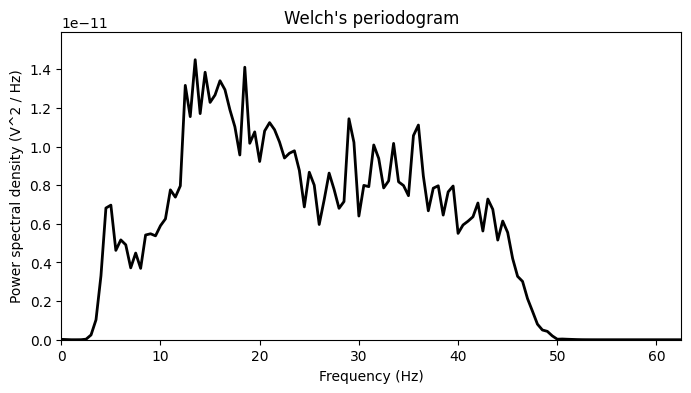

[-1.22874072e-05 -1.05952760e-05 -7.50616318e-06 ...  3.49479969e-06
  8.10354372e-06  2.58886833e-06]


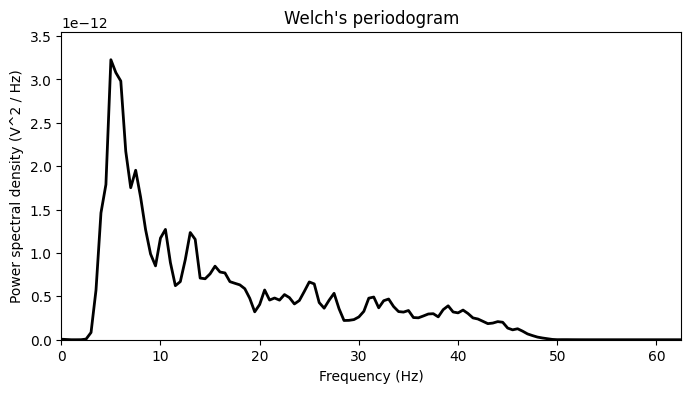

[ 3.62018297e-06  1.94478833e-06 -2.39651003e-07 ... -5.71683137e-06
 -3.68201581e-06  1.25080502e-06]


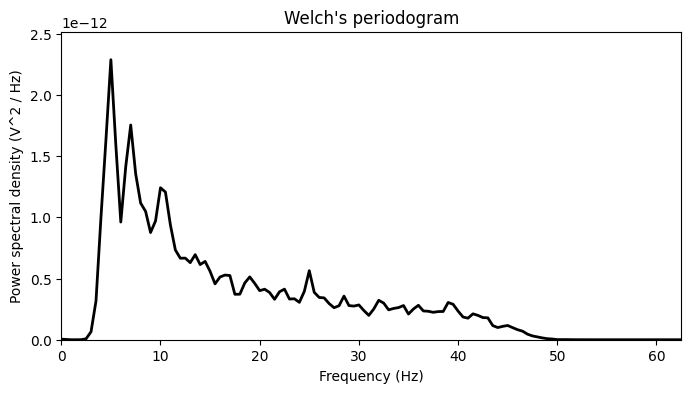

[-1.36481027e-05  1.72776084e-06  2.03445574e-05 ...  5.12964567e-05
  3.70828884e-06 -1.73582623e-05]


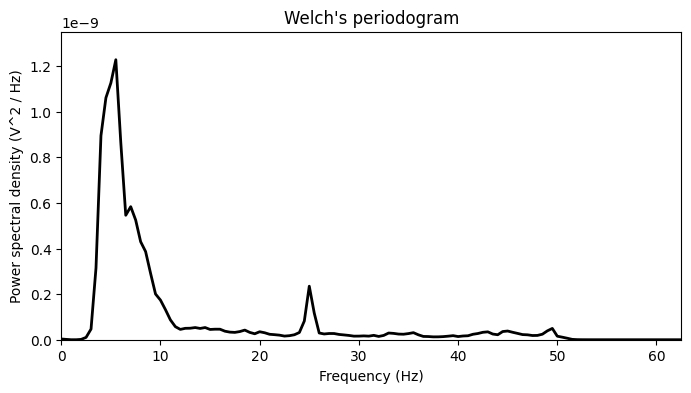

[-8.72197060e-07 -1.82930517e-05  9.19260892e-06 ...  1.24361248e-05
  4.06275752e-06 -2.32197165e-06]


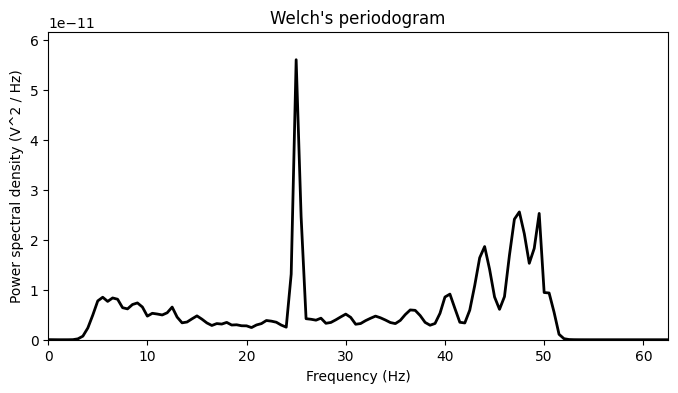

[ 7.06640352e-06  6.42723268e-06 -1.71318198e-06 ...  1.32311420e-06
 -1.61947463e-06  2.59811784e-06]


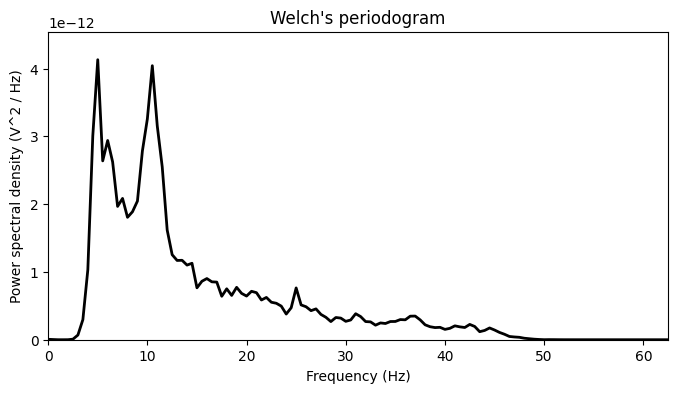

[ 6.31182624e-06 -4.52291115e-06 -3.27754583e-06 ...  1.48502672e-06
  2.42106240e-06  3.03506854e-06]


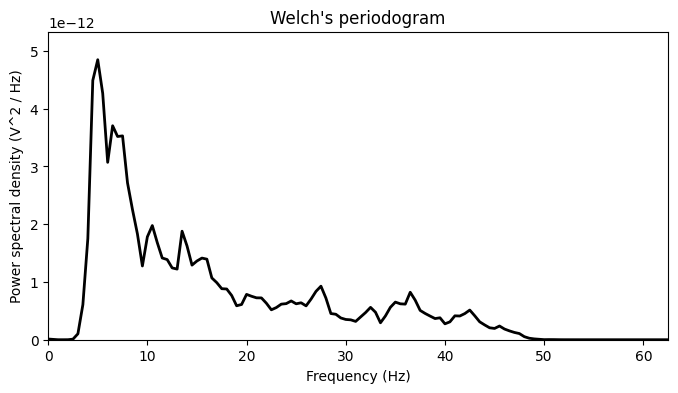

[-8.39693457e-06 -1.26157731e-05 -7.82969291e-06 ... -4.19456198e-06
 -1.88791352e-06  4.46104413e-06]


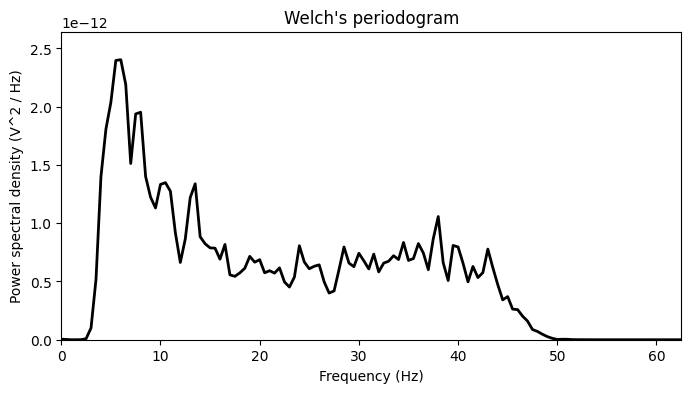

[ 3.64114820e-06 -5.04687095e-06 -3.25192739e-06 ...  1.48670721e-05
  6.72800630e-06 -2.93216819e-06]


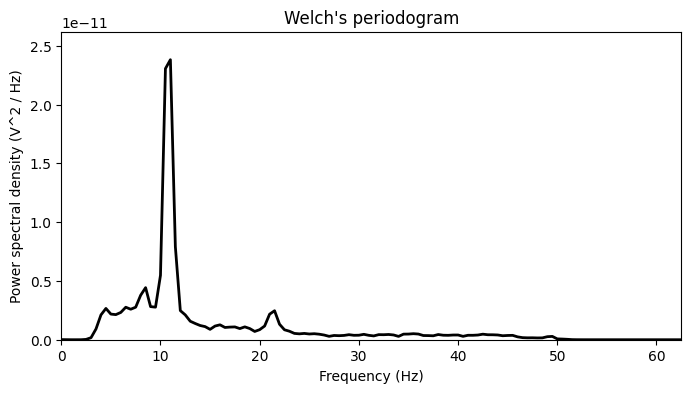

[ 8.53402133e-06  8.42879183e-06 -3.60993661e-06 ... -1.31807788e-06
 -5.70616825e-06 -6.84756412e-06]


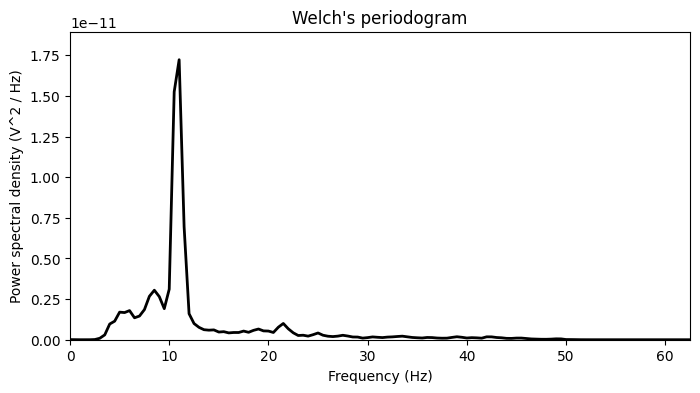

[-2.04043978e-07 -1.01126485e-05 -7.70847612e-06 ... -2.12796714e-06
  1.71890888e-06 -1.53835317e-06]


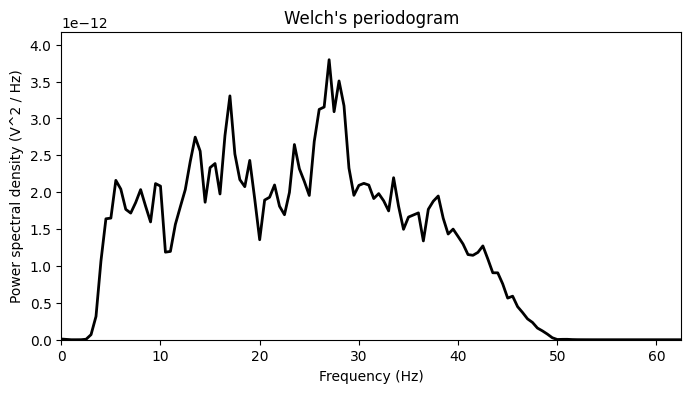

[-6.52389901e-06 -2.07858495e-07  1.05196287e-05 ...  1.38768542e-05
  1.52289543e-05 -1.23867260e-05]


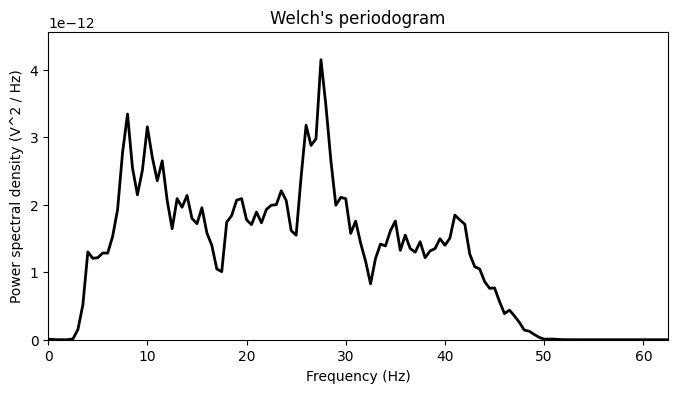

In [48]:
window_length = 2 # seconds
sf = 125
win = window_length*sf

for n in range(len(datanp)):
    sample = datanp[n]
    data = sample[3]
    xX=data.get_data()
    print(xX[0])
    freqs, psds = welch(xX[0], sf, nperseg=win)

    #sns.set(font_scale=1.2, style='white')
    plt.figure(figsize=(8, 4))
    plt.plot(freqs, psds, color='k', lw=2)
    plt.xlabel('Frequency (Hz)')
    plt.ylabel('Power spectral density (V^2 / Hz)')
    plt.ylim([0, psds.max() * 1.1])
    plt.title("Welch's periodogram")
    plt.xlim([0, freqs.max()])
    plt.show()

Effective window size : 16.384 (s)
Plotting power spectral density (dB=True).


C:\Users\Ilya\Documents\GitHub\EEG_feedback\EEG_testing\env\lib\site-packages\mne\viz\utils.py:167: UserWarning: FigureCanvasAgg is non-interactive, and thus cannot be shown
  (fig or plt).show(**kwargs)


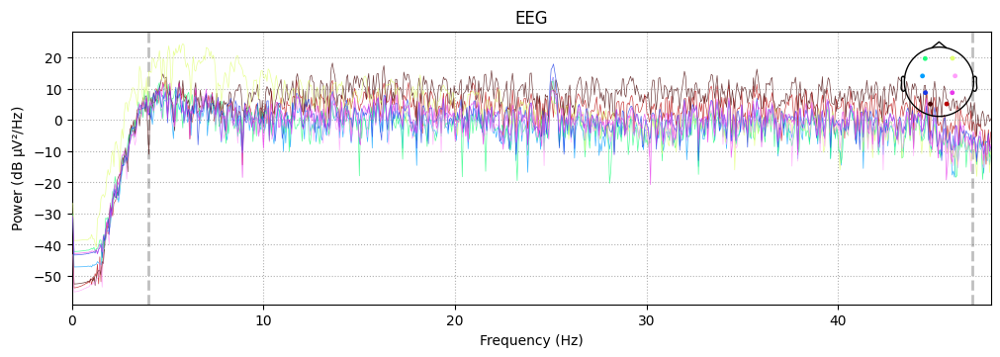

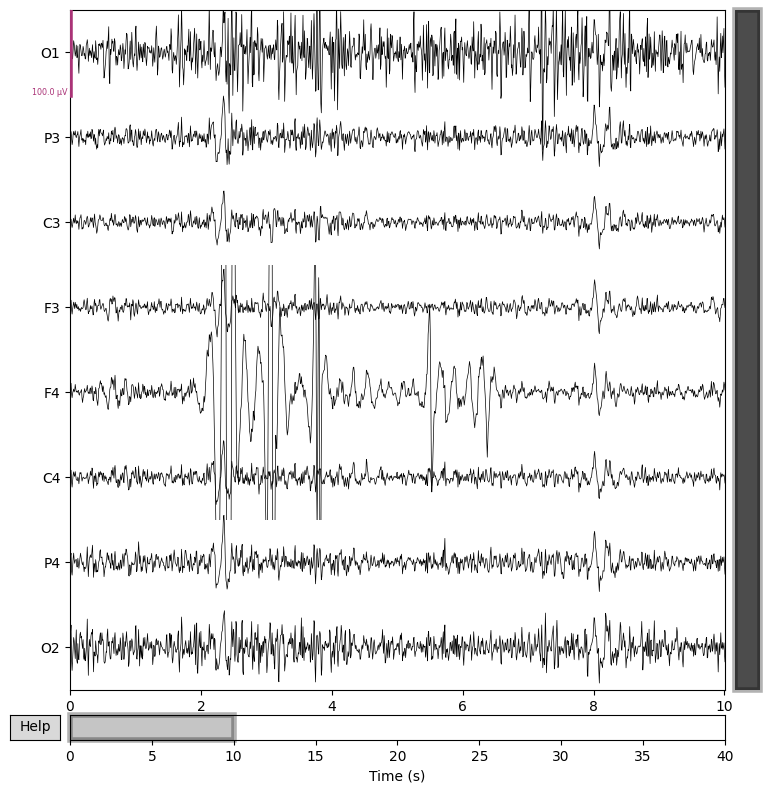

Effective window size : 16.384 (s)
Plotting power spectral density (dB=True).


C:\Users\Ilya\Documents\GitHub\EEG_feedback\EEG_testing\env\lib\site-packages\mne\viz\utils.py:167: UserWarning: FigureCanvasAgg is non-interactive, and thus cannot be shown
  (fig or plt).show(**kwargs)


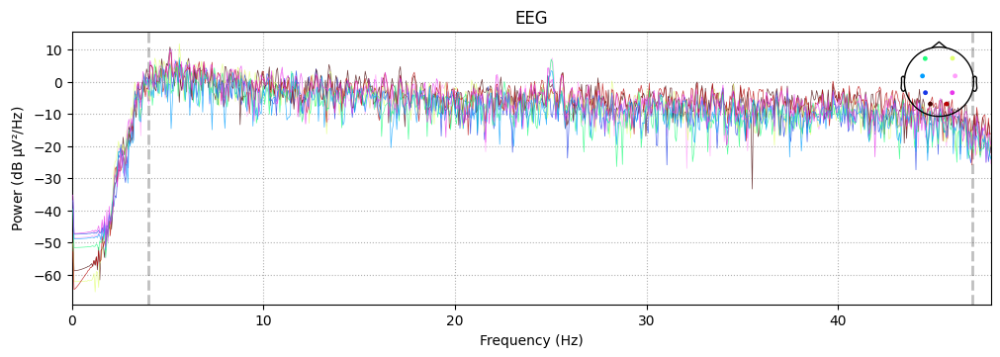

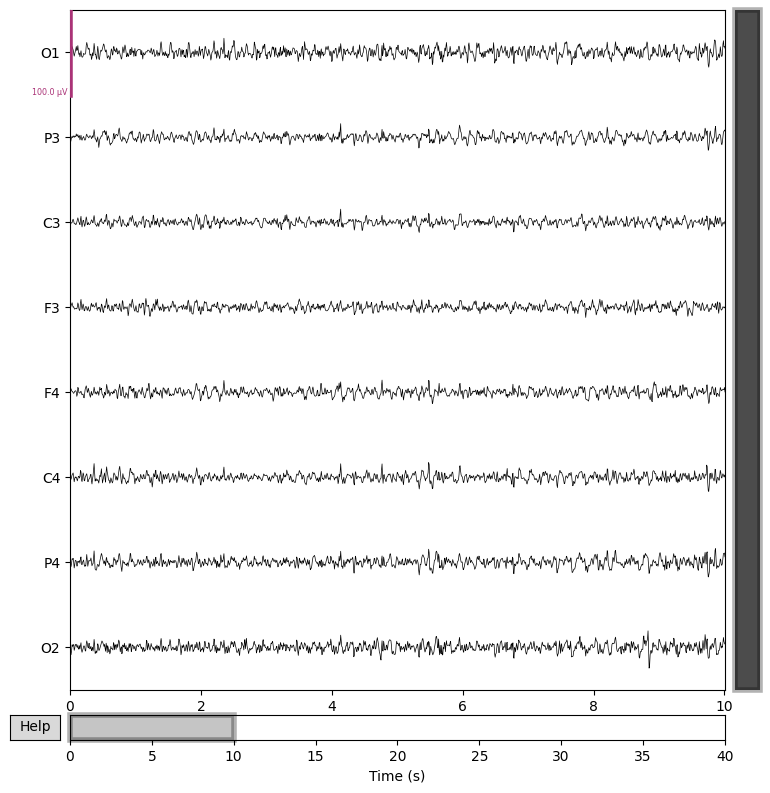

Effective window size : 16.384 (s)
Plotting power spectral density (dB=True).


C:\Users\Ilya\Documents\GitHub\EEG_feedback\EEG_testing\env\lib\site-packages\mne\viz\utils.py:167: UserWarning: FigureCanvasAgg is non-interactive, and thus cannot be shown
  (fig or plt).show(**kwargs)


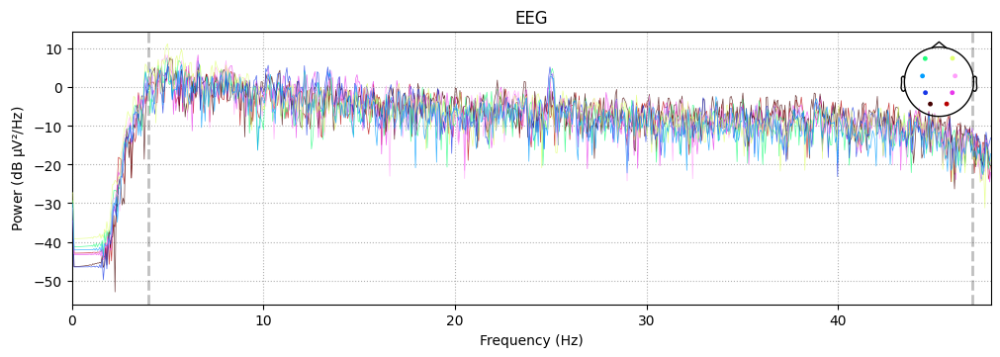

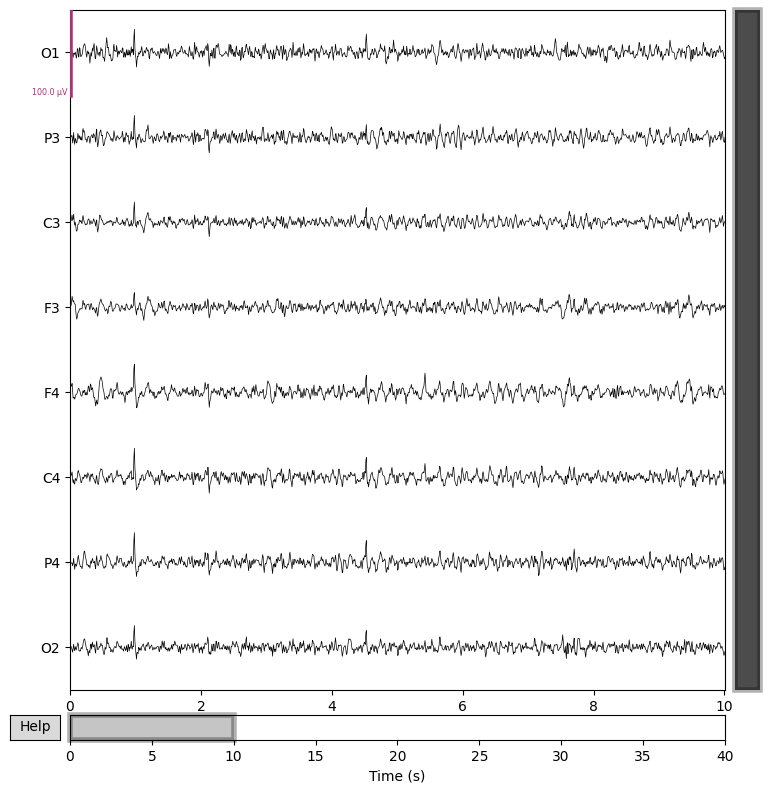

Effective window size : 16.384 (s)
Plotting power spectral density (dB=True).


C:\Users\Ilya\Documents\GitHub\EEG_feedback\EEG_testing\env\lib\site-packages\mne\viz\utils.py:167: UserWarning: FigureCanvasAgg is non-interactive, and thus cannot be shown
  (fig or plt).show(**kwargs)


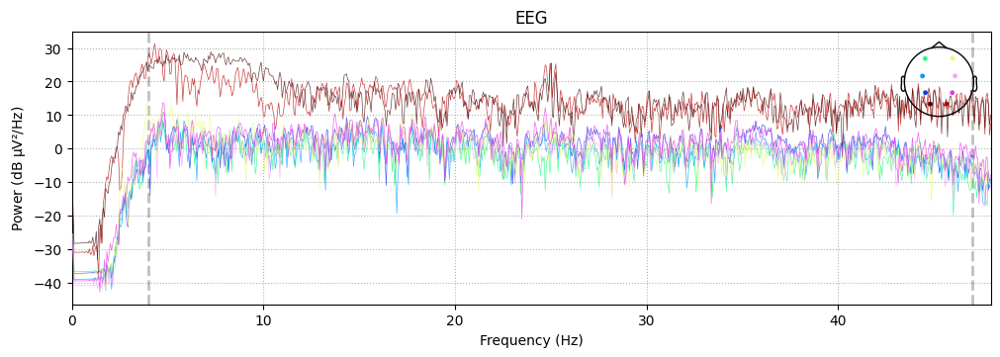

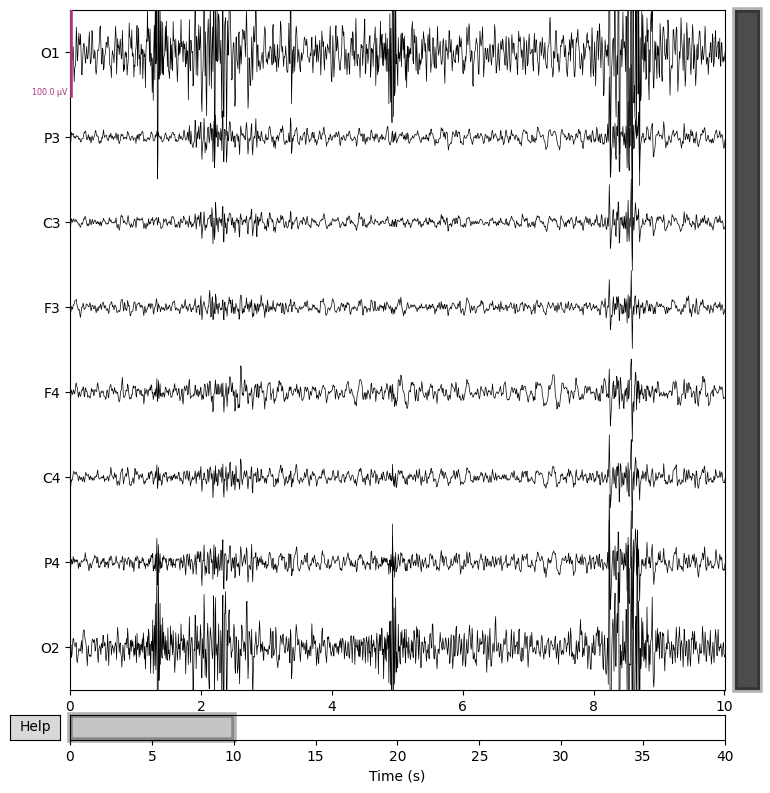

Effective window size : 16.384 (s)
Plotting power spectral density (dB=True).


C:\Users\Ilya\Documents\GitHub\EEG_feedback\EEG_testing\env\lib\site-packages\mne\viz\utils.py:167: UserWarning: FigureCanvasAgg is non-interactive, and thus cannot be shown
  (fig or plt).show(**kwargs)


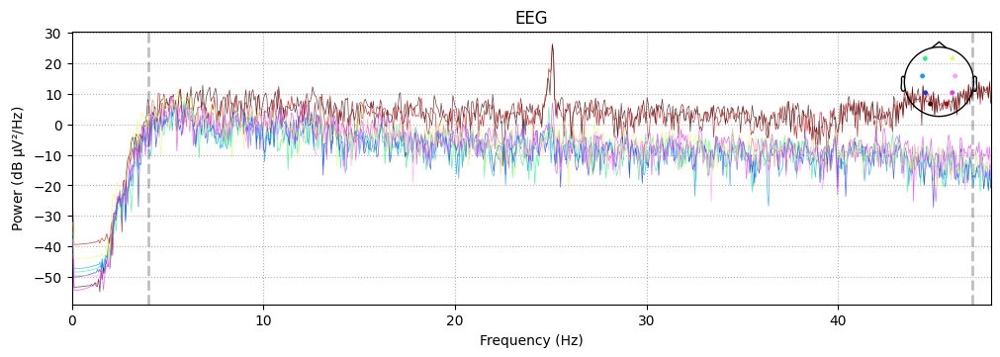

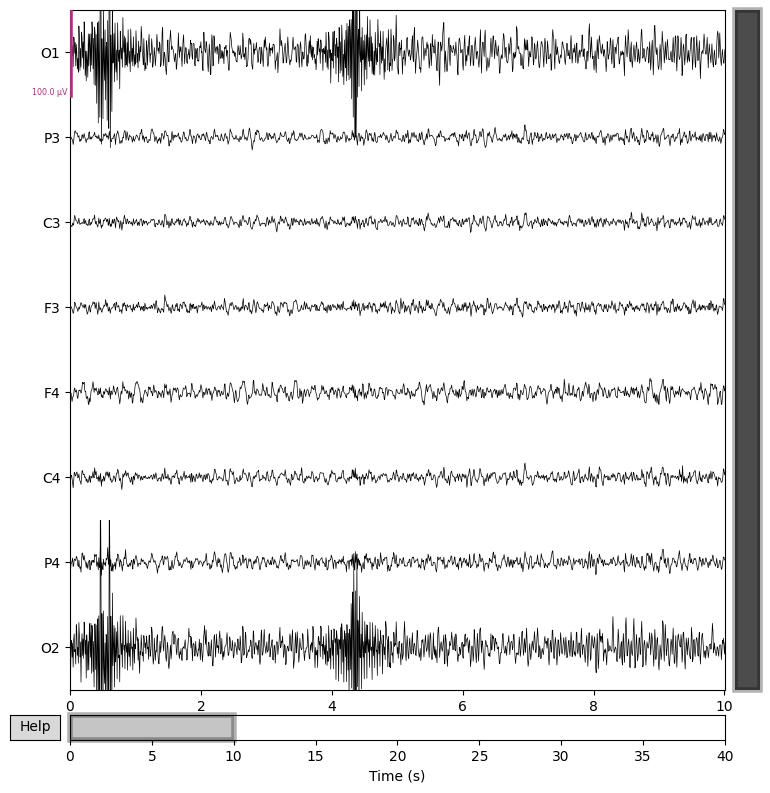

Effective window size : 16.384 (s)
Plotting power spectral density (dB=True).


C:\Users\Ilya\Documents\GitHub\EEG_feedback\EEG_testing\env\lib\site-packages\mne\viz\utils.py:167: UserWarning: FigureCanvasAgg is non-interactive, and thus cannot be shown
  (fig or plt).show(**kwargs)


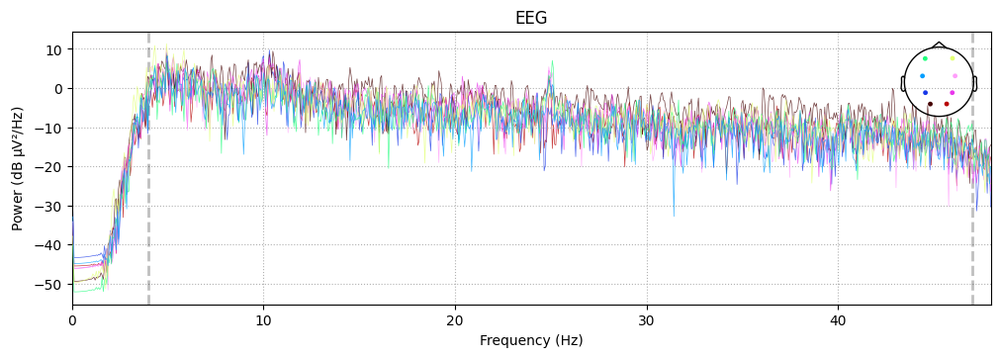

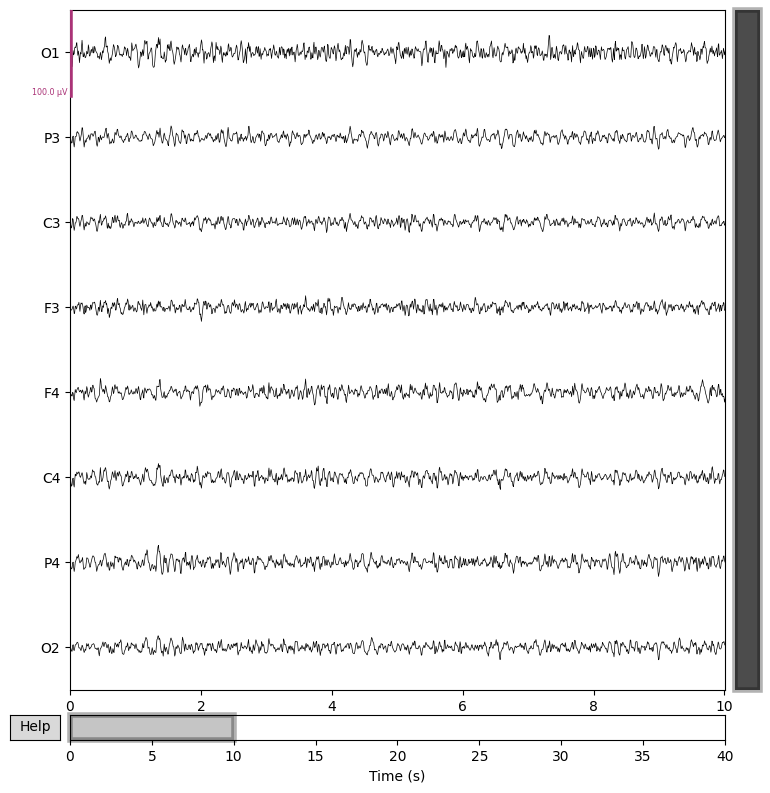

Effective window size : 16.384 (s)
Plotting power spectral density (dB=True).


C:\Users\Ilya\Documents\GitHub\EEG_feedback\EEG_testing\env\lib\site-packages\mne\viz\utils.py:167: UserWarning: FigureCanvasAgg is non-interactive, and thus cannot be shown
  (fig or plt).show(**kwargs)


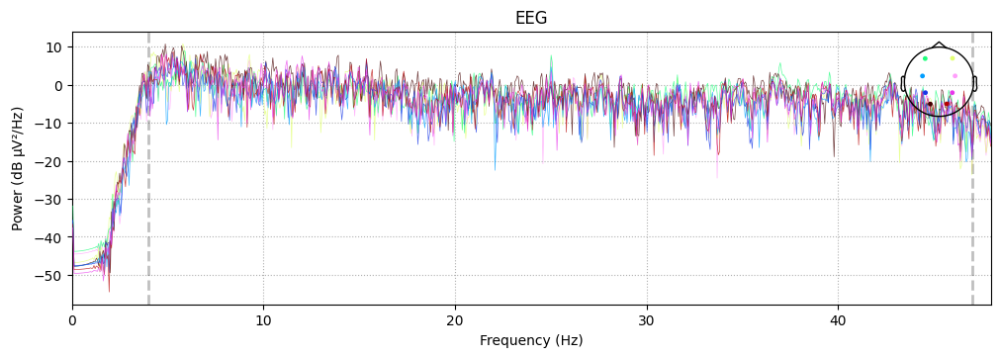

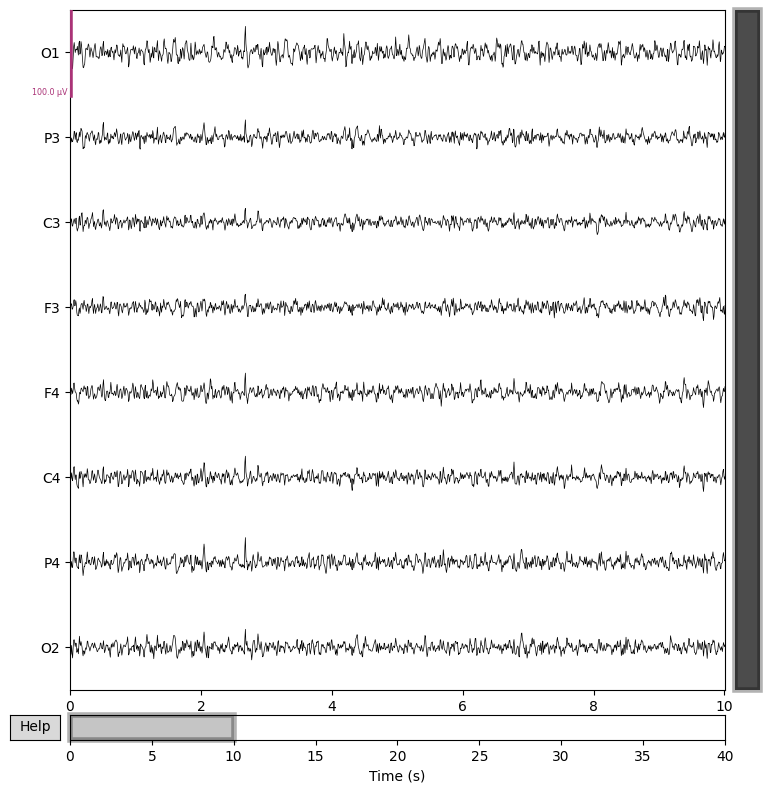

Effective window size : 16.384 (s)
Plotting power spectral density (dB=True).


C:\Users\Ilya\Documents\GitHub\EEG_feedback\EEG_testing\env\lib\site-packages\mne\viz\utils.py:167: UserWarning: FigureCanvasAgg is non-interactive, and thus cannot be shown
  (fig or plt).show(**kwargs)


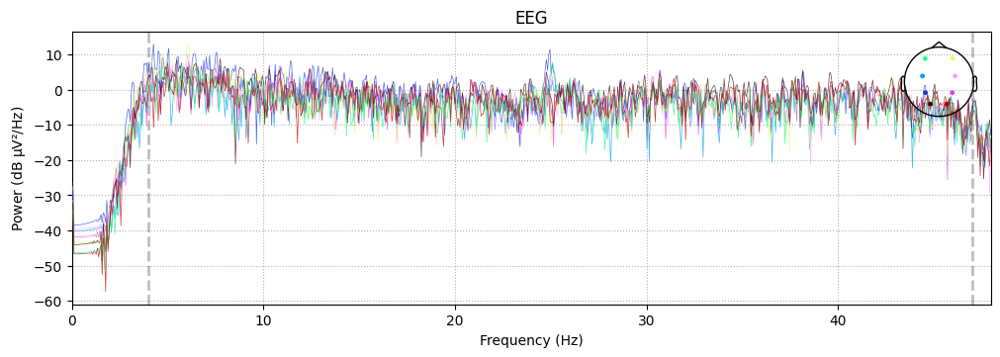

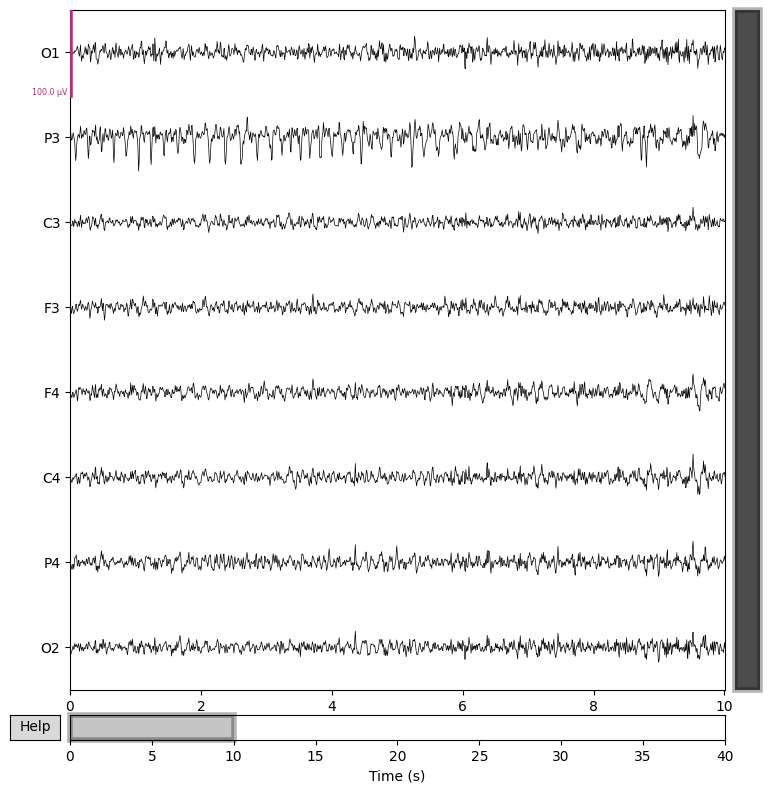

Effective window size : 16.384 (s)
Plotting power spectral density (dB=True).


C:\Users\Ilya\Documents\GitHub\EEG_feedback\EEG_testing\env\lib\site-packages\mne\viz\utils.py:167: UserWarning: FigureCanvasAgg is non-interactive, and thus cannot be shown
  (fig or plt).show(**kwargs)


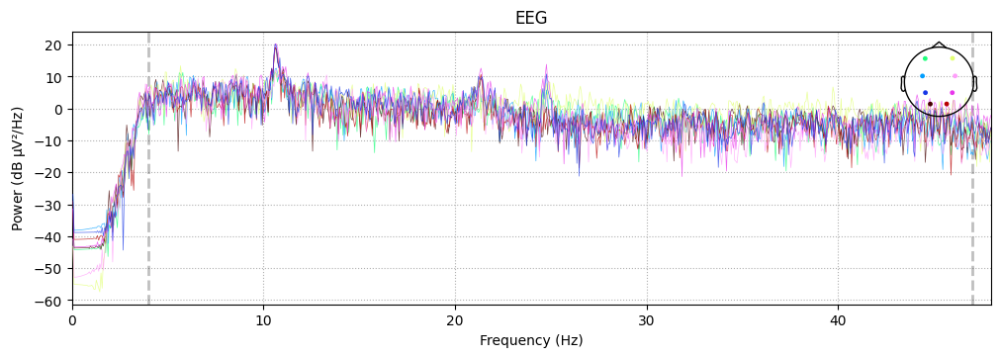

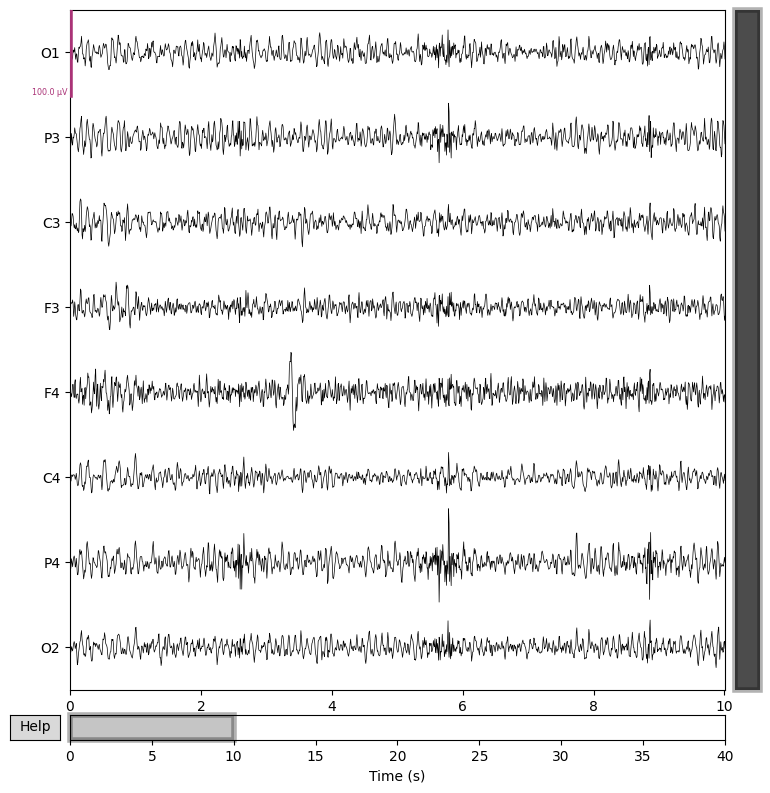

Effective window size : 16.384 (s)
Plotting power spectral density (dB=True).


C:\Users\Ilya\Documents\GitHub\EEG_feedback\EEG_testing\env\lib\site-packages\mne\viz\utils.py:167: UserWarning: FigureCanvasAgg is non-interactive, and thus cannot be shown
  (fig or plt).show(**kwargs)


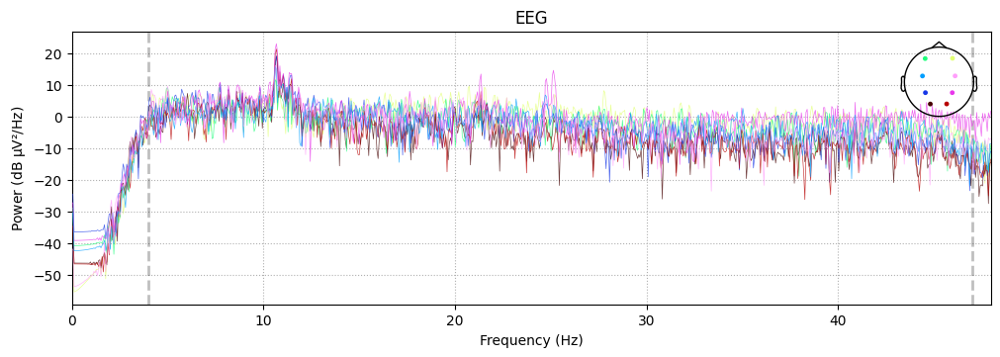

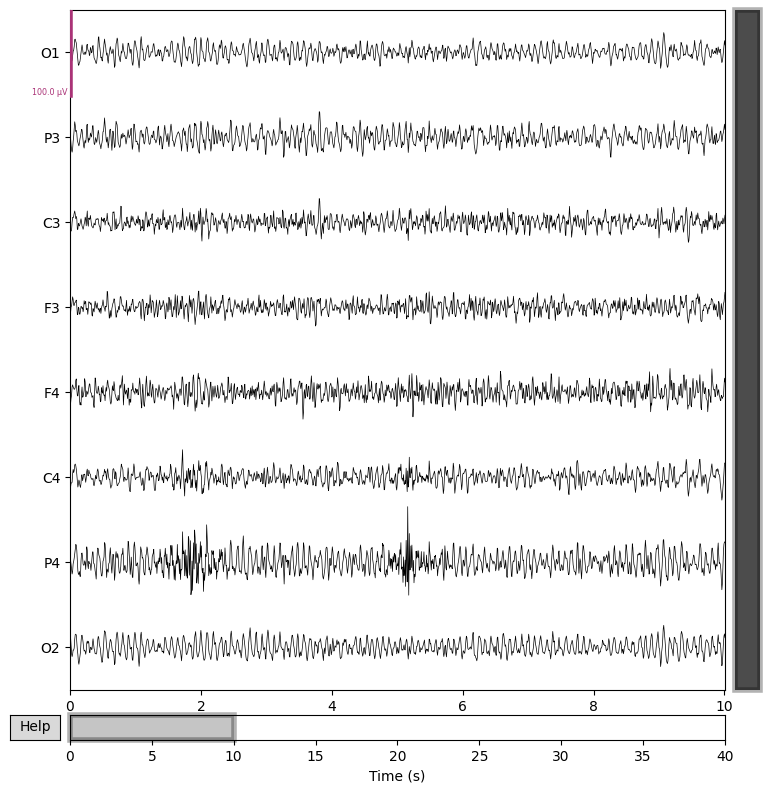

Effective window size : 16.384 (s)
Plotting power spectral density (dB=True).


C:\Users\Ilya\Documents\GitHub\EEG_feedback\EEG_testing\env\lib\site-packages\mne\viz\utils.py:167: UserWarning: FigureCanvasAgg is non-interactive, and thus cannot be shown
  (fig or plt).show(**kwargs)


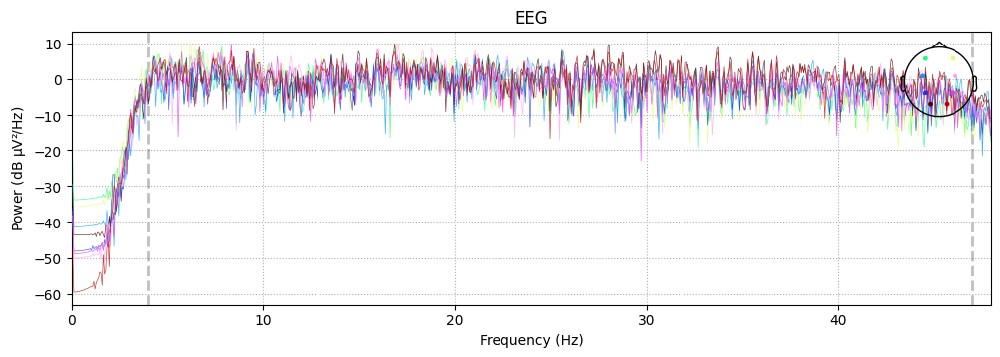

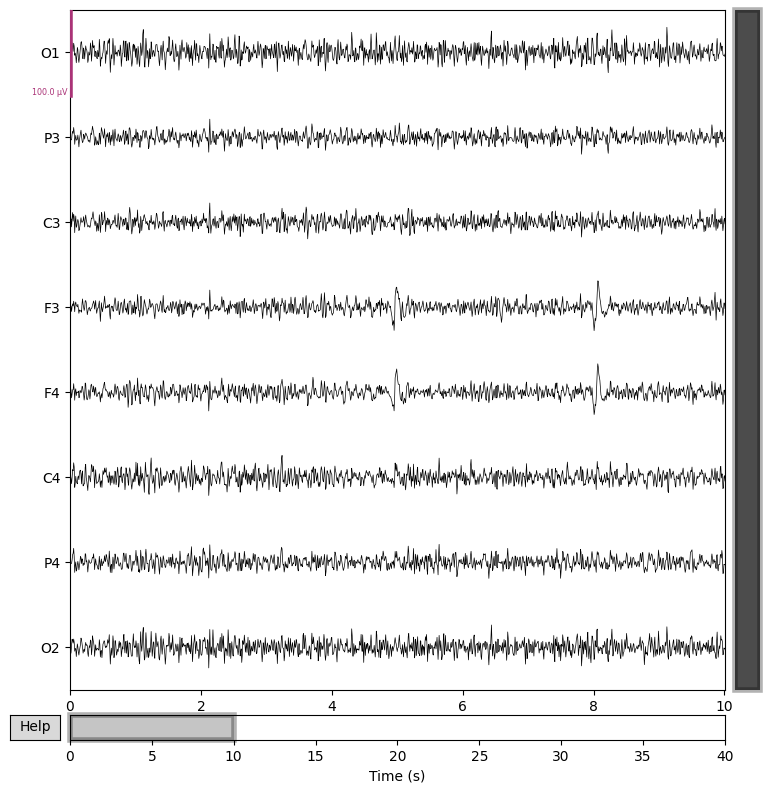

Effective window size : 16.384 (s)
Plotting power spectral density (dB=True).


C:\Users\Ilya\Documents\GitHub\EEG_feedback\EEG_testing\env\lib\site-packages\mne\viz\utils.py:167: UserWarning: FigureCanvasAgg is non-interactive, and thus cannot be shown
  (fig or plt).show(**kwargs)


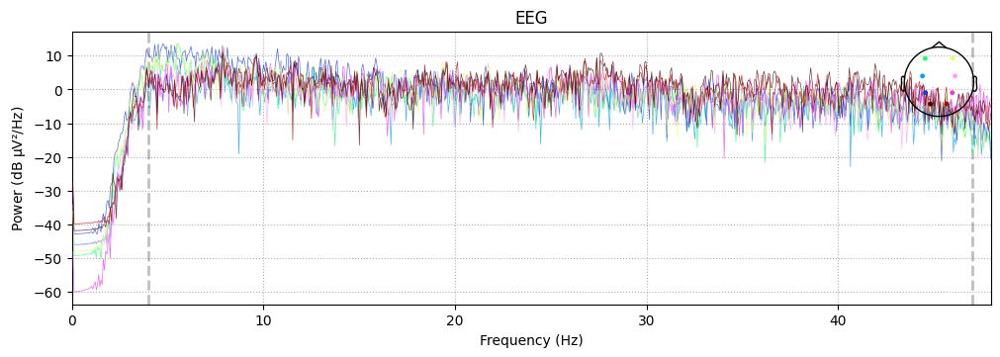

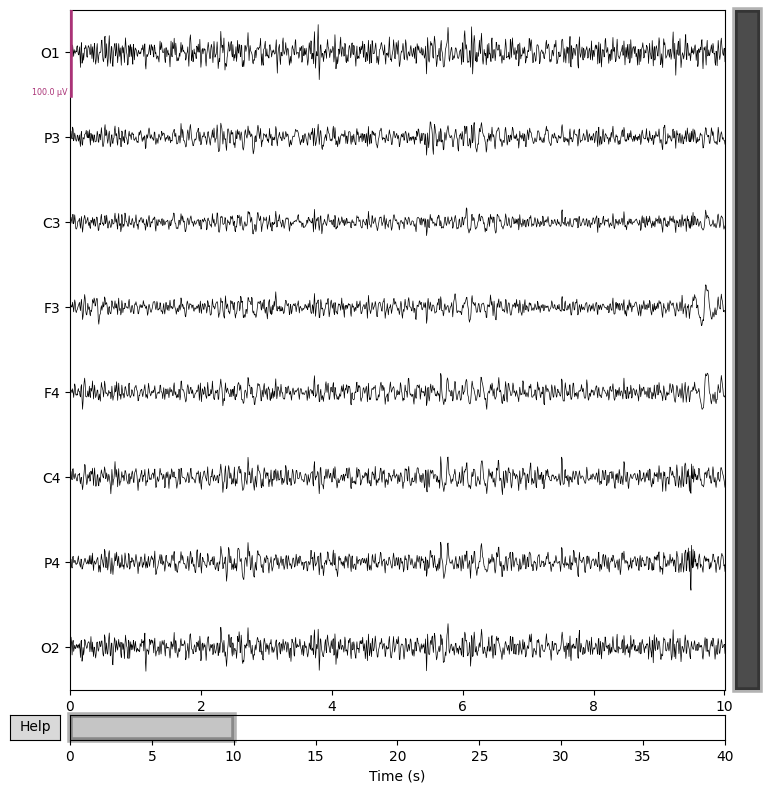

In [49]:
for n in range(len(datanp)):
    sample = datanp[n]
    data = sample[3]
    data.compute_psd(fmax=48).plot(picks="data", exclude="bads", amplitude=False)
    #ep.get_data()[j].compute_psd(fmax=62).plot(picks="data", exclude="bads", amplitude=False, average=True)
    data.plot(scalings=50e-6)

[ 2.          2.48484848  2.96969697  3.45454545  3.93939394  4.42424242
  4.90909091  5.39393939  5.87878788  6.36363636  6.84848485  7.33333333
  7.81818182  8.3030303   8.78787879  9.27272727  9.75757576 10.24242424
 10.72727273 11.21212121 11.6969697  12.18181818 12.66666667 13.15151515
 13.63636364 14.12121212 14.60606061 15.09090909 15.57575758 16.06060606
 16.54545455 17.03030303 17.51515152 18.         18.48484848 18.96969697
 19.45454545 19.93939394 20.42424242 20.90909091 21.39393939 21.87878788
 22.36363636 22.84848485 23.33333333 23.81818182 24.3030303  24.78787879
 25.27272727 25.75757576 26.24242424 26.72727273 27.21212121 27.6969697
 28.18181818 28.66666667 29.15151515 29.63636364 30.12121212 30.60606061
 31.09090909 31.57575758 32.06060606 32.54545455 33.03030303 33.51515152
 34.         34.48484848 34.96969697 35.45454545 35.93939394 36.42424242
 36.90909091 37.39393939 37.87878788 38.36363636 38.84848485 39.33333333
 39.81818182 40.3030303  40.78787879 41.27272727 41.

C:\Users\Ilya\AppData\Local\Temp\ipykernel_15088\2780000230.py:4: FutureWarning: The current default of copy=False will change to copy=True in 1.7. Set the value of copy explicitly to avoid this warning
  print(ep.get_data().shape)
C:\Users\Ilya\AppData\Local\Temp\ipykernel_15088\2780000230.py:8: FutureWarning: The current default of copy=False will change to copy=True in 1.7. Set the value of copy explicitly to avoid this warning
  for j in range(ep.get_data().shape[0]):
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   4 out of   4 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   8 out of   8 | elapsed:    0.1s finished


Applying baseline correction (mode: logratio)


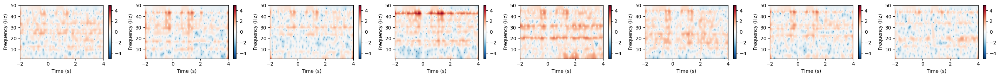

<Epochs |  1 events (all good), -2 – 4 s, baseline -2 – -2 s, ~65 kB, data loaded,
 'right answer': 1>


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   4 out of   4 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   8 out of   8 | elapsed:    0.0s finished


Applying baseline correction (mode: logratio)


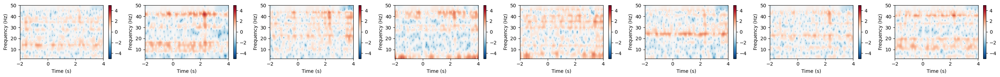

<Epochs |  1 events (all good), -2 – 4 s, baseline -2 – -2 s, ~65 kB, data loaded,
 'right answer': 1>


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   4 out of   4 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   8 out of   8 | elapsed:    0.0s finished


Applying baseline correction (mode: logratio)


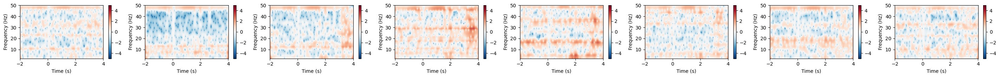

<Epochs |  1 events (all good), -2 – 4 s, baseline -2 – -2 s, ~65 kB, data loaded,
 'wrong answer': 1>


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   4 out of   4 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   8 out of   8 | elapsed:    0.1s finished


Applying baseline correction (mode: logratio)


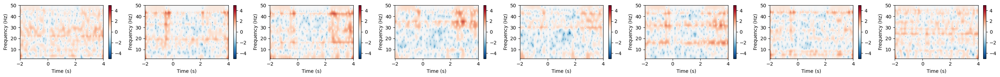

<Epochs |  1 events (all good), -2 – 4 s, baseline -2 – -2 s, ~65 kB, data loaded,
 'wrong answer': 1>


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   4 out of   4 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   8 out of   8 | elapsed:    0.0s finished


Applying baseline correction (mode: logratio)


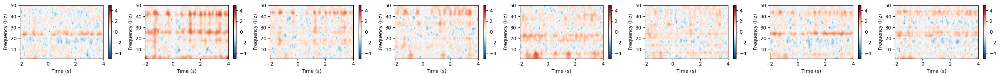

In [34]:
#freqs = np.logspace(np.log10(2), np.log10(55), 100)
freqs = np.linspace(2, 50, 100)
print(freqs)
print(ep.get_data().shape)
n_cyc = freqs /2
#n_cyc = 6
print(n_cyc)
for j in range(ep.get_data().shape[0]):
    print(ep[j])
    #dt = data[j].get_data()
    #dt = dt.reshape((1, dt.shape[0], dt.shape[1]))
    #print(dt.shape)
    #power = mne.time_frequency.tfr_array_morlet(dt, 125, freqs, n_cyc, use_fft=True, output='power')
    power = ep[j].compute_tfr(method='morlet', freqs=freqs, n_cycles=n_cyc)
    av = power
    fig, axarr = plt.subplots(1, 8, figsize=(36,2))
    
    #power.plot(picks='data', axes=axarr, baseline=(0, 0.1), mode='logratio')
    power.plot(picks='data', axes=axarr, baseline=(0, 0.1), mode='logratio', vlim=(-5,5))

In [35]:
#freqs = np.logspace(np.log10(2), np.log10(55), 100)
freqs = np.linspace(2, 50, 100)
print(freqs)
print(data.shape)
n_cyc = freqs /2
#n_cyc = 6
print(n_cyc)
for j in range(data.shape[0]):
    print(data[j])
    #dt = data[j].get_data()
    #dt = dt.reshape((1, dt.shape[0], dt.shape[1]))
    #print(dt.shape)
    #power = mne.time_frequency.tfr_array_morlet(dt, 125, freqs, n_cyc, use_fft=True, output='power')
    power = data[j].compute_tfr(method='morlet', freqs=freqs, n_cycles=n_cyc)
    av = power
    fig, axarr = plt.subplots(1, 8, figsize=(36,2))
    
    #power.plot(picks='data', axes=axarr, baseline=(0, 0.1), mode='logratio')
    power.plot(picks='data', axes=axarr, baseline=(0, 0.1), mode='logratio', vlim=(-5,5))

[ 2.          2.48484848  2.96969697  3.45454545  3.93939394  4.42424242
  4.90909091  5.39393939  5.87878788  6.36363636  6.84848485  7.33333333
  7.81818182  8.3030303   8.78787879  9.27272727  9.75757576 10.24242424
 10.72727273 11.21212121 11.6969697  12.18181818 12.66666667 13.15151515
 13.63636364 14.12121212 14.60606061 15.09090909 15.57575758 16.06060606
 16.54545455 17.03030303 17.51515152 18.         18.48484848 18.96969697
 19.45454545 19.93939394 20.42424242 20.90909091 21.39393939 21.87878788
 22.36363636 22.84848485 23.33333333 23.81818182 24.3030303  24.78787879
 25.27272727 25.75757576 26.24242424 26.72727273 27.21212121 27.6969697
 28.18181818 28.66666667 29.15151515 29.63636364 30.12121212 30.60606061
 31.09090909 31.57575758 32.06060606 32.54545455 33.03030303 33.51515152
 34.         34.48484848 34.96969697 35.45454545 35.93939394 36.42424242
 36.90909091 37.39393939 37.87878788 38.36363636 38.84848485 39.33333333
 39.81818182 40.3030303  40.78787879 41.27272727 41.

NameError: name 'dt' is not defined

In [ ]:
for j in range(data.shape[0]):
    print(j)

    print(marks[j])
    data[j].copy().compute_psd(picks="data").plot_topomap(ch_type='eeg', normalize=False, contours=0)

1


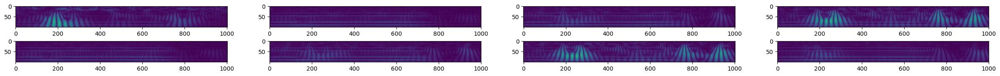

1


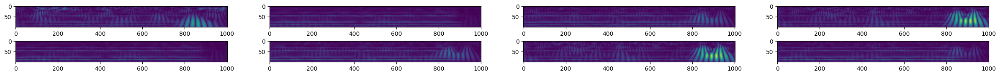

0


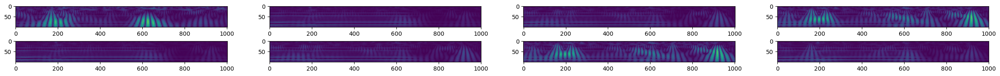

0


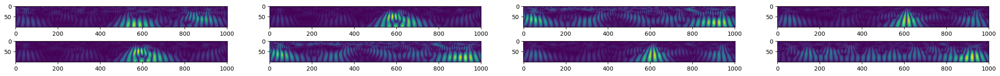

0


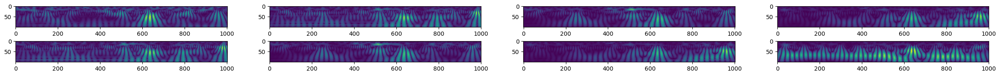

1


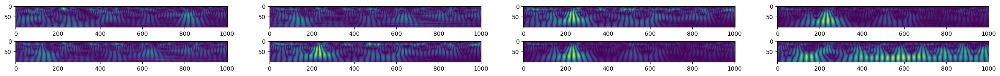

0


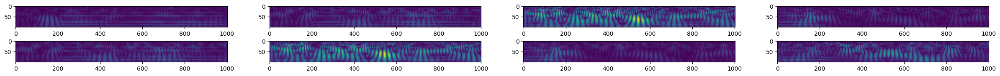

1


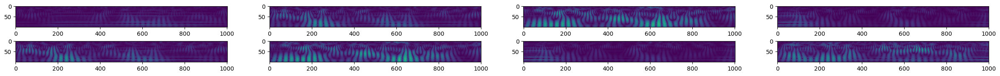

1


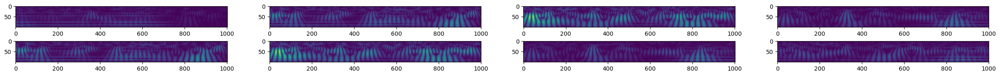

In [133]:
# генерация скалограммы 1 субъекта 1
wavelet = 'morl'
sampling_period = 1 / 125
scales = np.logspace(np.log10(2), np.log10(50), 100)
f = pywt.scale2frequency(wavelet, scales)/sampling_period
results_tr = []
#sample1 = tf.convert_to_tensor(values, dtype=tf.float32)
#gc.collect()
#print(values.shape)
# визуализация скалограммы 1 субъекта 1
for j in range(9):
    #cwtmatr, freqs = pywt.cwt(data[j].get_data().copy(), np.logspace(np.log10(1), np.log10(45), 50), wavelet=wavelet, axis=1)
    cwtmatr, freqs = pywt.cwt(data[j].get_data().copy(), np.linspace(2, 50, 100), wavelet=wavelet, axis=1)
    values = np.abs(cwtmatr)
    values = np.swapaxes(values, 0, 1)
    fig, axarr = plt.subplots(2, 4, figsize=(30,2)) 
    for i in range(2):
      for a in range(4):
        axarr[i][a].imshow(values[i+a])
    print(marks[j])
    plt.show()

In [56]:
data[j].get_data().shape

(8, 376)

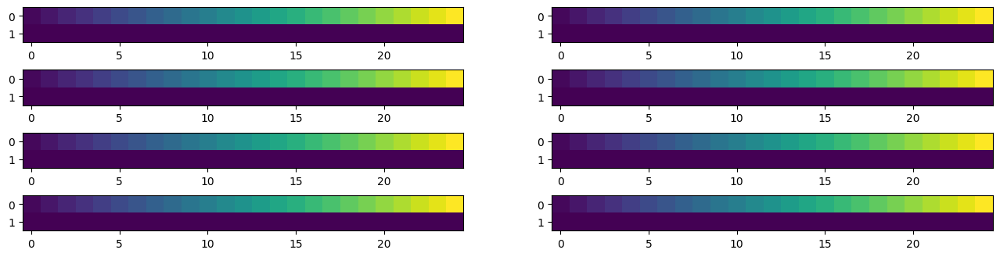

In [83]:
import emd
fig, axarr = plt.subplots(4, 2, figsize=(16,4))
for i in range(4):
    for j in range(2):
        imf = emd.sift.sift(data[i+j-1,:])
        IP, IF, IA = emd.spectra.frequency_transform(imf, 125, 'hilbert')
        freq_edges, freq_bins = emd.spectra.define_hist_bins(0, 25, 25)
        hht = emd.spectra.hilberthuang(IF, IA, freq_edges)
        #print(hht)
        #hht[hht > 0.0] = 1.0
        #ht = np.nan_to_num(hht, nan=0.0, posinf=0.0, neginf=0.0)
        axarr[i][j].imshow(hht)
plt.show()

(8, 100, 376)


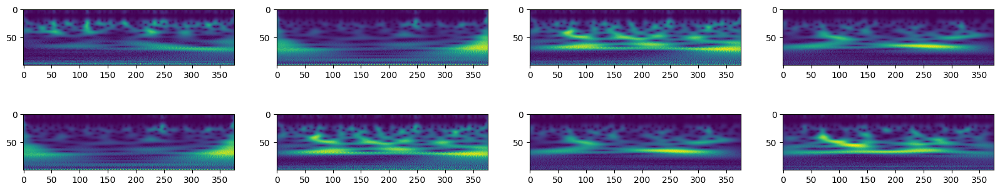

In [81]:
# визуализация скалограммы одной записи
wavelet = 'cmor1.5-1.0'
sampling_period = 1 / 125
scales = np.logspace(np.log10(2), np.log10(320), 75)
f = pywt.scale2frequency(wavelet, scales)/sampling_period
#print(list(zip(f, scales)))
data = loaded_data.get_data()
cwtmatr, freqs = pywt.cwt(data, np.logspace(np.log10(1), np.log10(320), 100), wavelet=wavelet, axis=1)
values = np.abs(cwtmatr)
values = np.swapaxes(values, 0, 1)
print(values.shape)
fig, axarr = plt.subplots(2, 4, figsize=(20,4)) 
for i in range(2):
  for j in range(4):
    axarr[i][j].imshow(values[i+j])
plt.show()

In [3]:
events = mne.events_from_annotations(loaded_data)
arr_events = events[0]
arr_events

Used Annotations descriptions: ['end task', 'fake wrong answer', 'right answer', 'start task']


array([[     1,      0,      4],
       [ 30760,      0,      2],
       [ 30925,      0,      1],
       [ 30925,      0,      4],
       [ 62368,      0,      2],
       [ 62524,      0,      1],
       [ 62524,      0,      4],
       [ 97123,      0,      3],
       [ 97333,      0,      1],
       [ 97333,      0,      4],
       [113761,      0,      3],
       [113926,      0,      1],
       [113926,      0,      4],
       [148156,      0,      3],
       [148327,      0,      1],
       [148327,      0,      4],
       [179641,      0,      3],
       [180052,      0,      1],
       [180052,      0,      4],
       [190804,      0,      3],
       [190804,      0,      1],
       [190804,      0,      4]])

In [4]:
arr_events.shape

(22, 3)

In [5]:
filtered_data = loaded_data.copy().filter(l_freq=None, h_freq=40., fir_design='firwin', method='iir', iir_params=None)
filtered_data = filtered_data.copy().filter(l_freq=2.,h_freq=None, fir_design='firwin', method='iir', iir_params=None)

raw_data = filtered_data.get_data()

Filtering raw data in 1 contiguous segment
Setting up low-pass filter at 40 Hz

IIR filter parameters
---------------------
Butterworth lowpass zero-phase (two-pass forward and reverse) non-causal filter:
- Filter order 8 (effective, after forward-backward)
- Cutoff at 40.00 Hz: -6.02 dB

Filtering raw data in 1 contiguous segment
Setting up high-pass filter at 2 Hz

IIR filter parameters
---------------------
Butterworth highpass zero-phase (two-pass forward and reverse) non-causal filter:
- Filter order 8 (effective, after forward-backward)
- Cutoff at 2.00 Hz: -6.02 dB



In [6]:
filtered_data.info

<Info | 7 non-empty values
 bads: []
 ch_names: O1, P3, C3, F3, F4, C4, P4, O2
 chs: 8 EEG
 custom_ref_applied: False
 highpass: 2.0 Hz
 lowpass: 40.0 Hz
 meas_date: 2023-05-24 17:03:51 UTC
 nchan: 8
 projs: []
 sfreq: 125.0 Hz
>

Using matplotlib as 2D backend.


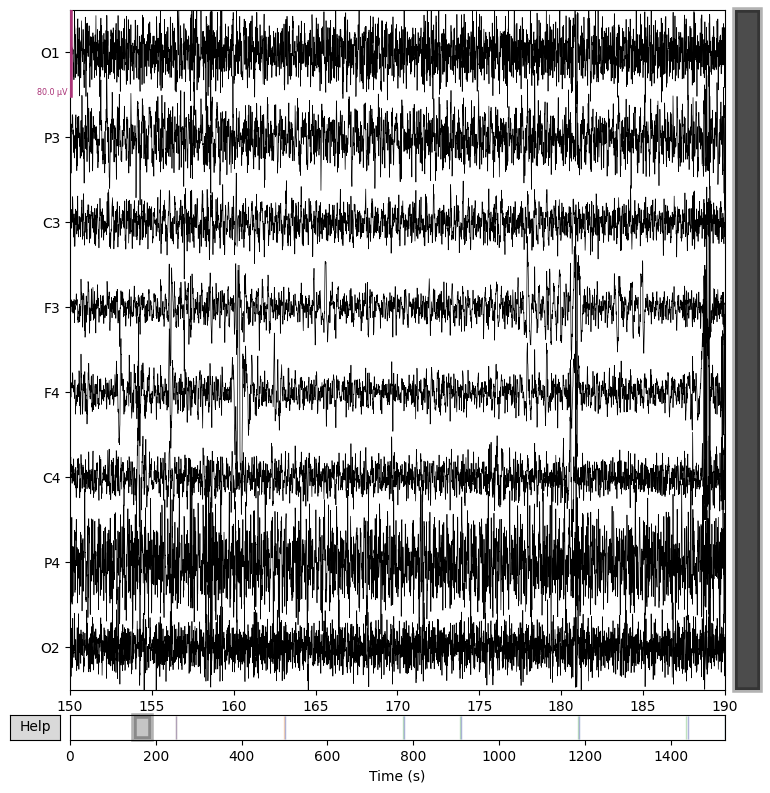

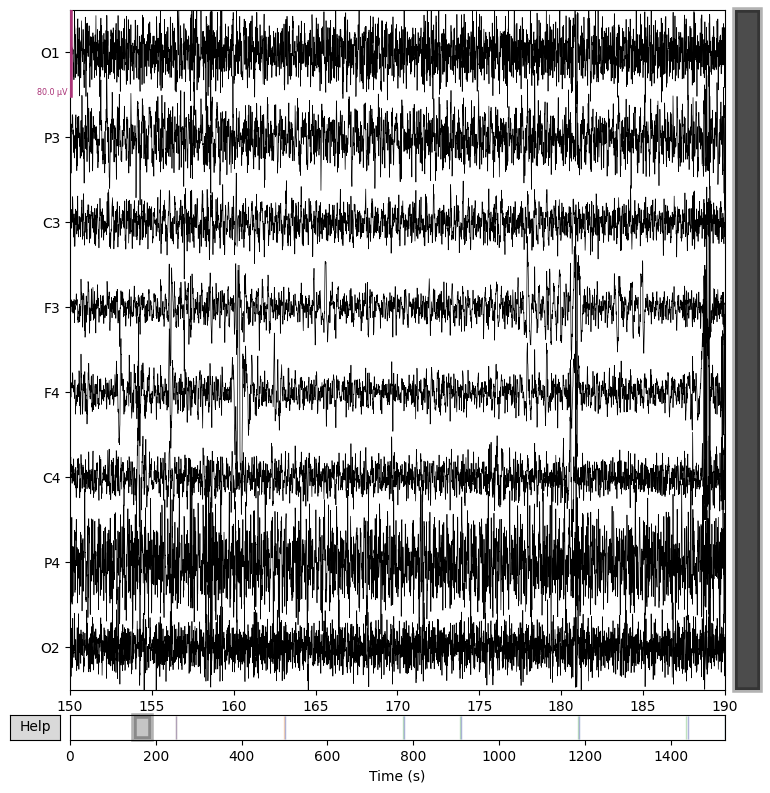

In [7]:
filtered_data.plot(start=150, duration=40, proj=False, n_channels=len(filtered_data.ch_names), remove_dc=False, scalings=40e-6)

NOTE: plot_psd() is a legacy function. New code should use .compute_psd().plot().
Effective window size : 16.384 (s)


C:\Users\Ilya\AppData\Local\Temp\ipykernel_11320\3296019125.py:2: RuntimeWarning: Channel locations not available. Disabling spatial colors.
  filtered_data.plot_psd(area_mode='range', tmax=1200.0, picks='data', average=False)
C:\Users\Ilya\Documents\GitHub\EEG_feedback\EEG_testing\env\lib\site-packages\mne\viz\utils.py:137: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  (fig or plt).show(**kwargs)


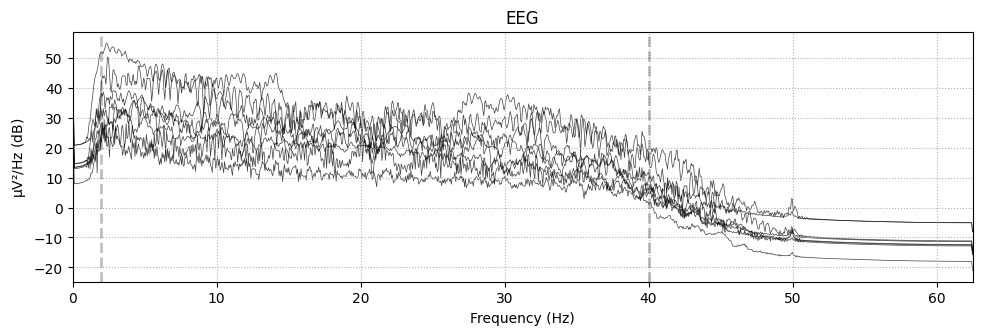

In [8]:
picks = mne.pick_types(filtered_data.info, meg='mag', eeg=True, eog=False, stim=False, exclude='bads')
filtered_data.plot_psd(area_mode='range', tmax=1200.0, picks='data', average=False)

NOTE: plot_psd() is a legacy function. New code should use .compute_psd().plot().
Effective window size : 16.384 (s)


C:\Users\Ilya\AppData\Local\Temp\ipykernel_11320\1547064175.py:1: RuntimeWarning: Channel locations not available. Disabling spatial colors.
  loaded_data.plot_psd(area_mode='range', tmax=40.0, picks='data', average=False)
C:\Users\Ilya\Documents\GitHub\EEG_feedback\EEG_testing\env\lib\site-packages\mne\viz\utils.py:137: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  (fig or plt).show(**kwargs)


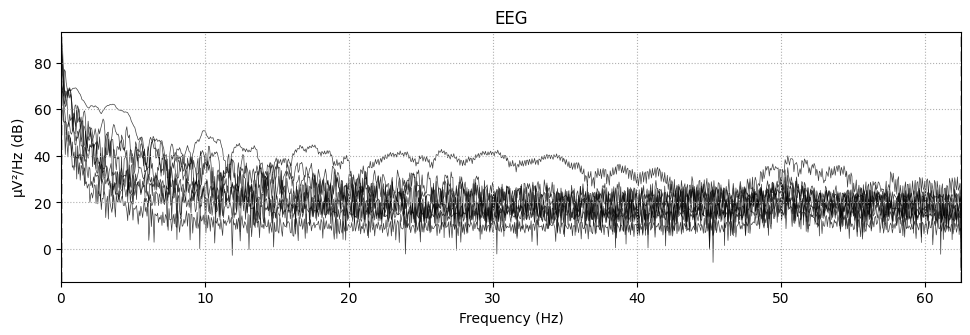

In [9]:
loaded_data.plot_psd(area_mode='range', tmax=40.0, picks='data', average=False)

In [71]:
time = 2
num = 5000//(125*time)
ans_data = np.zeros((1,8,125*time))
marks = np.full((9*num),0)
m = np.full((9*num),1)
marks = np.concatenate((marks, m), axis=0)

sample = datanp[0]
for i in range(9):
    data = sample[i].get_data()
    for j in range(num):
        ans = np.array(data[:,(j*125*time):((j+1)*125*time)])
        ans = ans.reshape(1,ans.shape[0],ans.shape[1])
        ans_data = np.concatenate((ans_data, ans), axis=0)

sample = datanp[1]
for i in range(9):
    data = sample[i].get_data()
    for j in range(num):
        ans = np.array(data[:,(j*125*time):((j+1)*125*time)])
        ans = ans.reshape(1,ans.shape[0],ans.shape[1])
        ans_data = np.concatenate((ans_data, ans), axis=0)

ans_data = ans_data[1:,:,:]
print(ans_data.shape)
print(marks.shape)

(360, 8, 250)
(360,)


In [20]:
ans_data = np.zeros((1,8,126))
test_data = np.zeros((1,8,126))

marks = np.full((9),0)
m1 = np.full((12),1)
marks = np.concatenate((marks, m1), axis=0)

marks_t = np.full((6),0)
m1 = np.full((8),1)
marks_t = np.concatenate((marks_t, m1), axis=0)

sample = datanp[1]
for i in range(9):
    data = sample[i].get_data()
    psds, freqs = mne.time_frequency.psd_array_welch(x=data, sfreq=sf, n_fft=(window_length*sf))
    ans = np.array(psds)
    ans = ans.reshape(1,ans.shape[0],ans.shape[1])
    ans_data = np.concatenate((ans_data, ans), axis=0)

sample = datanp[3]
for i in range(12):
    data = sample[i+4].get_data()
    psds, freqs = mne.time_frequency.psd_array_welch(x=data, sfreq=sf, n_fft=(window_length*sf))
    ans = np.array(psds)
    ans = ans.reshape(1,ans.shape[0],ans.shape[1])
    ans_data = np.concatenate((ans_data, ans), axis=0)

sample = datanp[0]
for i in range(6):
    data = sample[i].get_data()
    psds, freqs = mne.time_frequency.psd_array_welch(x=data, sfreq=sf, n_fft=(window_length*sf))
    ans = np.array(psds)
    ans = ans.reshape(1,ans.shape[0],ans.shape[1])
    test_data = np.concatenate((test_data, ans), axis=0)

sample = datanp[2]
for i in range(8):
    data = sample[i+4].get_data()
    psds, freqs = mne.time_frequency.psd_array_welch(x=data, sfreq=sf, n_fft=(window_length*sf))
    ans = np.array(psds)
    ans = ans.reshape(1,ans.shape[0],ans.shape[1])
    test_data = np.concatenate((test_data, ans), axis=0)

ans_data = ans_data[1:,:,:]
test_data = test_data[1:,:,:]
print(ans_data.shape)
print(marks.shape)
print(test_data.shape)
print(marks_t.shape)

Effective window size : 2.000 (s)
Effective window size : 2.000 (s)
Effective window size : 2.000 (s)
Effective window size : 2.000 (s)
Effective window size : 2.000 (s)
Effective window size : 2.000 (s)
Effective window size : 2.000 (s)
Effective window size : 2.000 (s)
Effective window size : 2.000 (s)
Effective window size : 2.000 (s)
Effective window size : 2.000 (s)
Effective window size : 2.000 (s)
Effective window size : 2.000 (s)
Effective window size : 2.000 (s)
Effective window size : 2.000 (s)
Effective window size : 2.000 (s)
Effective window size : 2.000 (s)
Effective window size : 2.000 (s)
Effective window size : 2.000 (s)
Effective window size : 2.000 (s)
Effective window size : 2.000 (s)
Effective window size : 2.000 (s)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent work

Effective window size : 2.000 (s)
Effective window size : 2.000 (s)
Effective window size : 2.000 (s)
Effective window size : 2.000 (s)
Effective window size : 2.000 (s)
Effective window size : 2.000 (s)
Effective window size : 2.000 (s)
Effective window size : 2.000 (s)
Effective window size : 2.000 (s)
Effective window size : 2.000 (s)
Effective window size : 2.000 (s)
Effective window size : 2.000 (s)
Effective window size : 2.000 (s)
(21, 8, 126)
(21,)
(14, 8, 126)
(14,)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent work

In [30]:
from sklearn.model_selection import train_test_split
from sklearn import neighbors
from sklearn.model_selection import cross_validate
from sklearn import svm
from sklearn.preprocessing import Normalizer
from sklearn.naive_bayes import GaussianNB
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import accuracy_score, classification_report
from sklearn.utils import shuffle

X = ans_data.copy()
Y = marks.copy()
X = X.reshape(X.shape[0], X.shape[1]*X.shape[2])
scaler = Normalizer().fit(X)
X = scaler.transform(X)


X_t = test_data.copy()
Y_t = marks_t.copy()
X_t = X_t.reshape(X_t.shape[0], X_t.shape[1]*X_t.shape[2])
scaler = Normalizer().fit(X_t)
X_t = scaler.transform(X_t)

x_train, x_test, y_train, y_test = train_test_split(X_t, Y_t, test_size=0.30, random_state=10)

#x_train, x_test, y_train, y_test = train_test_split(X, Y, test_size=0.50, random_state=10)

#x_train, y_train = shuffle(X, Y, random_state=10)
x_val, y_val =  shuffle(X, Y, random_state=10)

print(x_train.shape, x_test.shape, y_train.shape, y_test.shape)

model = neighbors.KNeighborsClassifier(n_neighbors = 5)
model.fit(x_train.copy(), y_train.copy())
print(model.score(x_test.copy(), y_test.copy()))
cv_results = cross_validate(model, X, Y, cv = 4)
print(cv_results['test_score'])
pre_Y = model.predict(x_val.copy())
print("true: ", y_val.copy())
print("pred: ", pre_Y)
print("\n", classification_report(y_val.copy(), pre_Y))

(9, 1008) (5, 1008) (9,) (5,)
1.0
[1. 1. 1. 1.]
true:  [1 0 0 1 0 1 0 1 0 1 1 1 0 1 0 1 1 0 1 0 1]
pred:  [1 0 0 1 0 1 0 1 0 1 1 1 0 1 0 1 1 0 1 0 1]

               precision    recall  f1-score   support

           0       1.00      1.00      1.00         9
           1       1.00      1.00      1.00        12

    accuracy                           1.00        21
   macro avg       1.00      1.00      1.00        21
weighted avg       1.00      1.00      1.00        21



In [12]:
Y = np.array(marks)
Y.shape

(6,)

In [14]:
from sklearn.model_selection import train_test_split
X = X.reshape(X.shape[0], X.shape[1]*X.shape[2])
x_train, x_test, y_train, y_test = train_test_split(X, Y, test_size=0.33, random_state=0)
print(x_train.shape, x_test.shape, y_train.shape, y_test.shape)

(4, 1320) (2, 1320) (4,) (2,)


In [15]:
from sklearn.preprocessing import Normalizer
scaler = Normalizer().fit(x_train)
stand_x_train = scaler.transform(x_train)
scaler = Normalizer().fit(x_test)
stand_x_test = scaler.transform(x_test)
stand_x_test

array([[ 0.01381141,  0.0080356 ,  0.0024506 , ...,  0.00513701,
        -0.00328882, -0.00718541],
       [-0.00128062, -0.00791346, -0.04249903, ..., -0.05195689,
         0.01387797,  0.02738478]])

In [16]:
from sklearn import neighbors
knn = neighbors.KNeighborsClassifier(n_neighbors = 3)
knn.fit(stand_x_train, y_train)

KNeighborsClassifier(n_neighbors=3)

In [ ]:
data_dir = Path("data")
for file in data_dir.iterdir():
    if file.suffix == ".edf":
        